In [137]:
import os
import sys
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from tqdm.notebook import tqdm
from collections import namedtuple
from collections import defaultdict
from pprint import pprint

# Configure display options
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
%config InlineBackend.figure_format = 'retina'

# Add project directory to sys.path
pdir = os.path.abspath(os.path.join(os.getcwd(), '.'))
sys.path.insert(1, pdir)
from myutils import *

# Other module imports
import ast, math, swifter, csv, json, itertools as it, portion as P

# Set plot style
# plt.style.use('ggplot')

# Functions & Methods

In [138]:
import numpy as np
import pandas as pd
import datetime as dt
from collections import namedtuple
import ast, swifter
import math
import portion as P
from pprint import pprint

# ************************************************* unify data format *************************************************

def set_data(df, mode='pcap', tz=0):
    def nr_serv_cel(row):
        pos = row.serv_cel_pos
        if pos == 255:
            return 65535, -160, -50
        else:
            return row[f'PCI{pos}'], row[f'RSRP{pos}'], row[f'RSRQ{pos}']
    
    if mode == 'pcap':
        common_column_names = [
            'seq', 'rpkg', 'frame_id', 'Timestamp', 'Timestamp_epoth', 'lost', 'excl', 'latency',
            'xmit_time', 'xmit_time_epoch', 'arr_time', 'arr_time_epoch',
        ]
        
        if df.empty:
            return pd.DataFrame(columns=common_column_names)
        
        date_columns = ['Timestamp', 'xmit_time', 'arr_time']
        df[date_columns] = df[date_columns].apply(pd.to_datetime)
        df[['seq', 'rpkg', 'frame_id']] = df[['seq', 'rpkg', 'frame_id']].astype('Int32')
        df[['Timestamp_epoch', 'xmit_time_epoch', 'arr_time_epoch', 'latency']] = \
            df[['Timestamp_epoch', 'xmit_time_epoch', 'arr_time_epoch', 'latency']].astype('float32')
        df[['lost', 'excl']] = df[['lost', 'excl']].astype('boolean')

    if mode in ['lte', 'nr']:
        common_column_names = [
            'Timestamp', 'type_id', 'PCI', 'RSRP', 'RSRQ', 'serv_cel_index', 'EARFCN', 'NR_ARFCN', 
            'num_cels', 'num_neigh_cels', 'serv_cel_pos', 'PCI0', 'RSRP0', 'RSRQ0',
        ]
        
        if df.empty:
            return pd.DataFrame(columns=common_column_names)
        
        if mode == 'lte':
            columns_mapping = {
                'RSRP(dBm)': 'RSRP',
                'RSRQ(dB)': 'RSRQ',
                'Serving Cell Index': 'serv_cel_index',
                'Number of Neighbor Cells': 'num_neigh_cels',
                'Number of Detected Cells': 'num_cels',
            }
            columns_order = [*common_column_names, *df.columns[df.columns.get_loc('PCI1'):].tolist()]
            
            df = df.rename(columns=columns_mapping).reindex(columns_order, axis=1)
            df['serv_cel_index'] = np.where(df['serv_cel_index'] == '(MI)Unknown', '3_SCell', df['serv_cel_index'])
            df['num_cels'] = df['num_neigh_cels'] + 1
            df['type_id'] = 'LTE_PHY'

        if mode == 'nr':
            columns_mapping = {
                'Raster ARFCN': 'NR_ARFCN',
                'Serving Cell Index': 'serv_cel_pos',
                'Num Cells': 'num_cels',
            }
            columns_order = [*common_column_names, *df.columns[df.columns.get_loc('PCI1'):].tolist()]
            
            df = df.rename(columns=columns_mapping).reindex(columns_order, axis=1)
            df[['PCI', 'RSRP', 'RSRQ']] = df.apply(nr_serv_cel, axis=1, result_type='expand')
            df['serv_cel_index'] = np.where(df['serv_cel_pos'] == 255, df['serv_cel_index'], 'PSCell')
            df['num_neigh_cels'] = np.where(df['serv_cel_pos'] == 255, df['num_cels'], df['num_cels'] - 1)
            df['type_id'] = '5G_NR_ML1'
        
        df['Timestamp'] = pd.to_datetime(df['Timestamp']) + pd.Timedelta(hours=tz)
        df[['type_id', 'serv_cel_index']] = df[['type_id', 'serv_cel_index']].astype('category')
        df[['EARFCN', 'NR_ARFCN']] = df[['EARFCN', 'NR_ARFCN']].astype('Int32')
        df[['num_cels', 'num_neigh_cels', 'serv_cel_pos']] = df[['num_cels', 'num_neigh_cels', 'serv_cel_pos']].astype('UInt8')

        for tag in df.columns:
            if tag.startswith('PCI'):
                df[tag] = df[tag].astype('Int32')
            if tag.startswith(('RSRP', 'RSRQ')):
                df[tag] = df[tag].astype('float32')

    return df

# ************************************************* Sheng-Ru Latest Version (09-25) add try except (10-27) *************************************************

def parse_mi_ho(df, tz=8):

    # df = pd.read_csv(f)
    df["Timestamp"] = df["Timestamp"].swifter.apply(lambda x: pd.to_datetime(x) + dt.timedelta(hours=tz))
    nr_pci = 'O'
    scells = []

    def NR_OTA(idx):

        if df["type_id"].iloc[idx] == "5G_NR_RRC_OTA_Packet": return True
        else: return False
    
    def LTE_SERV_INFO(idx):

        if df["type_id"].iloc[idx] == "LTE_RRC_Serv_Cell_Info": return True
        else: return False
    

    def find_1st_after(start_idx, target, look_after=1):
        for j in range(start_idx, len(df)):
            t_ = df["Timestamp"].iloc[j]
            if NR_OTA(j) or LTE_SERV_INFO(j):
                continue
            if (t_ - t).total_seconds() > look_after:
                return None, None
            if df[target].iloc[j] not in [0,'0'] and not np.isnan(df[target].iloc[j]):
                return t_, j
        return None, None
    
    def find_1st_before(start_idx, target, look_before=1):
        for j in range(start_idx, -1, -1):
            t_ = df["Timestamp"].iloc[j]
            if NR_OTA(j) or LTE_SERV_INFO(j):
                continue
            if (t - t_).total_seconds() > look_before:
                return None, None
            if df[target].iloc[j] not in [0,'0'] and not np.isnan(df[target].iloc[j]):
                return t_, j
        return None, None
    
    def find_1st_before_with_special_value(start_idx, target, target_value, look_before=1):
        for j in range(start_idx, -1, -1):
            t_ = df["Timestamp"].iloc[j]
            if NR_OTA(j) or LTE_SERV_INFO(j):
                continue
            if (t - t_).total_seconds() > look_before:
                return None, None
            if df[target].iloc[j] in [target_value] and not np.isnan(df[target].iloc[j]):
                return t_, j
        return None, None
    
    def find_in_D_exact(targets):

        l = []
        # In l : (second, ho_type)
        for target in targets:
            for ho in D[target]:
                l.append(((t - ho.start).total_seconds(), target))

        if len(l) != 0:
            for x in l:
                if (x[0]== 0):
                    return x[1]
        
        return None
    
    def find_in_D_first_before(targets, look_before=1):

        l = []
        # In l : (second, ho_type)
        for target in targets:
            for ho in D[target]:
                try:
                    l.append(((t - ho.end).total_seconds(), target, ho))
                except:
                    pass

        if len(l) != 0:
            closest = min(filter(lambda x: x[0] > 0, l), key=lambda x: x[0])
            if 0 <= closest[0] < look_before:
                return closest[1], closest[2]
        
        return None, None
    
    HO = namedtuple('HO',['start', 'end', 'others', 'trans'], defaults=[None,None,'',''])
    
    D = {
        'Conn_Rel':[], 
        'Conn_Req':[], # Setup
        'LTE_HO': [], # LTE -> newLTE
        'MN_HO': [], # LTE + NR -> newLTE + NR
        'MN_HO_to_eNB': [], # LTE + NR -> newLTE
        'SN_setup': [], # LTE -> LTE + NR => NR setup
        'SN_Rel': [], # LTE + NR -> LTE
        'SN_HO': [], # LTE + NR -> LTE + newNR  
        'RLF_II': [],
        'RLF_III': [],
        'SCG_RLF': [],
        'Add_SCell': [],
        }

    for i in range(len(df)):

        # Pass NR RRC packet. In NSA mode, LTE RRC packet include NR packet message.
        if NR_OTA(i) or LTE_SERV_INFO(i):
            continue

        others = ''
        t = df["Timestamp"].iloc[i]

        if df["rrcConnectionRelease"].iloc[i] == 1:
            D['Conn_Rel'].append(HO(start=t))
            nr_pci = 'O'

        if df["rrcConnectionRequest"].iloc[i] == 1:
            
            # Define end of rrcConnectionRequest to be rrcConnectionReconfigurationComplete or securityModeComplete.
            a = find_1st_after(i, 'rrcConnectionReconfigurationComplete',look_after=2)[0]
            b = find_1st_after(i, 'securityModeComplete',look_after=2)[0]
            if a is None and b is None: end = None
            elif a is None and b is not None: end = b
            elif a is not None and b is None: end = a 
            else: end = a if a > b else b
            
            serv_cell, serv_freq = df["PCI"].iloc[i], int(df["Freq"].iloc[i])
            trans = f'? -> ({serv_cell}, {serv_freq})'
            D['Conn_Req'].append(HO(start=t,end=end,trans=trans))
            nr_pci = 'O'
        
        if df["lte-rrc.t304"].iloc[i] == 1:
            
            end, _ = find_1st_after(i, 'rrcConnectionReconfigurationComplete')
            serv_cell, target_cell = df["PCI"].iloc[i], int(df['lte_targetPhysCellId'].iloc[i])
            serv_freq, target_freq = int(df["Freq"].iloc[i]), int(df['dl-CarrierFreq'].iloc[i])

            if df["SCellToAddMod-r10"].iloc[i] == 1:
                n =len(str(df["SCellIndex-r10.1"].iloc[i]).split('@'))
                others += f' Set up {n} SCell.'
            else:
                scells = []
            
            if serv_freq != target_freq:
                a,b = find_1st_before(i, "rrcConnectionReestablishmentRequest", 1)
                others += " Inter frequency HO."
                if a is not None:
                    others += " Near after RLF."
                
            if df["nr-rrc.t304"].iloc[i] == 1 and df["dualConnectivityPHR: setup (1)"].iloc[i] == 1:
                
                if serv_cell == target_cell and serv_freq == target_freq:

                    a, _ = find_1st_before(i, "rrcConnectionReestablishmentRequest", 2)
                    
                    if a is not None:

                        ho_type, ho = find_in_D_first_before(['RLF_II', 'RLF_III'], 2)
                        try:
                            others += f' Near after RLF of trans: {ho.trans}.'
                        except:
                            others += f' Near after RLF.'

                    else:
                        
                        ho_type, _ = find_in_D_first_before(['MN_HO_to_eNB', 'SN_Rel'], 2)
                        if ho_type is not None:
                            others += f' Near after {ho_type}.'

                    ori_serv = nr_pci
                    nr_pci = int(df['nr_physCellId'].iloc[i])
                    trans = f'({serv_cell}, {serv_freq}) | {ori_serv} -> {nr_pci}'
                    D['SN_setup'].append(HO(start=t, end=end, others=others, trans=trans))

                else:
                    
                    nr_pci = int(df['nr_physCellId'].iloc[i])
                    trans = f'({serv_cell}, {serv_freq}) -> ({target_cell}, {target_freq}) | {nr_pci}'
                    D['MN_HO'].append(HO(start=t, end=end, others=others, trans=trans))

            else:
                
                if serv_cell == target_cell and serv_freq == target_freq:

                    a, b = find_1st_before(i, "scgFailureInformationNR-r15")
                    if a is not None:
                        others += " Caused by scg-failure."
                    
                    orig_serv = nr_pci
                    nr_pci = 'O'
                    trans = f'({serv_cell}, {serv_freq}) | {orig_serv} -> {nr_pci}'
                    D['SN_Rel'].append(HO(start=t, end=end, others=others, trans=trans))
                    
                else:

                    a, _ = find_1st_before(i,"rrcConnectionSetup",3)
                    if a is not None:
                        others += ' Near After connection setup.'
                    if nr_pci == 'O':
                        trans = f'({serv_cell}, {serv_freq}) -> ({target_cell}, {target_freq}) | {nr_pci}'
                        D['LTE_HO'].append(HO(start=t, end=end, others=others, trans=trans))
                    else:
                        orig_serv = nr_pci
                        nr_pci = 'O'
                        trans = f'({serv_cell}, {serv_freq}) -> ({target_cell}, {target_freq}) | {orig_serv} -> {nr_pci}'
                        D['MN_HO_to_eNB'].append(HO(start=t, end=end, others=others, trans=trans))


        if df["nr-rrc.t304"].iloc[i] == 1 and not df["dualConnectivityPHR: setup (1)"].iloc[i] == 1:

            end, _ = find_1st_after(i,'rrcConnectionReconfigurationComplete')
        
            serv_cell, serv_freq = df["PCI"].iloc[i], int(df["Freq"].iloc[i])
            orig_serv = nr_pci
            nr_pci = int(df['nr_physCellId'].iloc[i])
            trans = f'({serv_cell}, {serv_freq}) | {orig_serv} -> {nr_pci}'
            D['SN_HO'].append(HO(start=t,end=end,trans=trans))


        if df["rrcConnectionReestablishmentRequest"].iloc[i] == 1:

            end1, _ = find_1st_after(i, 'rrcConnectionReestablishmentComplete', look_after=1)
            b, _ = find_1st_after(i, 'rrcConnectionReestablishmentReject', look_after=1)
            end2, _ = find_1st_after(i, 'securityModeComplete',look_after=3)

            others += ' ' + df["reestablishmentCause"].iloc[i] + '.'
            scells = []

            c, _ = find_1st_before(i, 'scgFailureInformationNR-r15', 1)
            if c != None:
                others  += ' caused by scgfailure.'
                
            serv_cell, rlf_cell = df["PCI"].iloc[i], int(df['physCellId.3'].iloc[i])
            serv_freq = int(df['Freq'].iloc[i])
            
            # Type II & Type III
            if end1 is not None: 

                orig_serv = nr_pci
                nr_pci = 'O'
                _, idx = find_1st_before_with_special_value(i, 'PCI', rlf_cell, look_before=10)
                try:
                    rlf_freq = int(df['Freq'].iloc[idx])
                except:
                    rlf_freq = 0
                trans = f'({rlf_cell}, {rlf_freq}) -> ({serv_cell}, {serv_freq}) | {orig_serv} -> {nr_pci}'
                D['RLF_II'].append(HO(start=t,end=end1,others=others,trans=trans))

            elif b is not None and end2 is not None:
                
                orig_serv = nr_pci
                nr_pci = 'O'
                _, idx = find_1st_before_with_special_value(i, 'PCI', rlf_cell, look_before=10)
                try:
                    rlf_freq = int(df['Freq'].iloc[idx])
                except:
                    rlf_freq = 0

                _, idx = find_1st_after(i, "rrcConnectionRequest", 2)
                recon_cell, recon_freq = df['PCI'].iloc[idx], int(float(df['Freq'].iloc[idx]))
                
                trans = f'({rlf_cell}, {rlf_freq}) -> ({recon_cell}, {recon_freq}) | {orig_serv} -> {nr_pci}'
                D['RLF_III'].append(HO(start=t,end=end2,others=others,trans=trans))
                
            else:
                others+=' No end.'
                D['RLF_II'].append(HO(start=t,others=others))
                print('No end for RLF')

        if df["scgFailureInformationNR-r15"].iloc[i] == 1:

            others += ' ' + df["failureType-r15"].iloc[i] + '.'
            a, idx1 = find_1st_after(i, "rrcConnectionReestablishmentRequest", look_after=1)
            b, idx2 = find_1st_after(i, "lte-rrc.t304", look_after=10)

            if a is not None:

                end1, _ = find_1st_after(idx1, 'rrcConnectionReestablishmentComplete', look_after=1)
                b, _ = find_1st_after(idx1, 'rrcConnectionReestablishmentReject', look_after=1)
                end2 = find_1st_after(idx1, 'securityModeComplete',look_after=3)[0]

                others += ' Result in rrcReestablishment.'
                    
                # Type II & Type III Result
                if end1 is not None: 
                    D['SCG_RLF'].append(HO(start=t,end=end1,others=others))
                elif b is not None and end2 is not None: 
                    D['SCG_RLF'].append(HO(start=t,end=end2,others=others))
                else:
                    others += ' No end.'
                    D['SCG_RLF'].append(HO(start=t,others=others))
                    print('No end for scg failure result in rrcReestablishment.')

            elif b is not None:

                end, _ = find_1st_after(idx2, 'rrcConnectionReconfigurationComplete')
                serv_cell, target_cell = df["PCI"].iloc[idx2], df['lte_targetPhysCellId'].iloc[idx2]
                serv_freq, target_freq = int(df["Freq"].iloc[idx2]), df['dl-CarrierFreq'].iloc[idx2]
                others += ' Result in gNB release.'
                # We do not change nr_pci here. Instead, we will change it at gNB_Rel event.
                trans = f'({serv_cell}, {serv_freq}) | {nr_pci} -> O'
                
                if serv_cell == target_cell and serv_freq == target_freq:
                    D['SCG_RLF'].append(HO(start=t,end=end,others=others,trans=trans))
                else:
                    others += ' Weird gNB release.'
                    print('Weird for scg failure result in gNb Release.')
                    D['SCG_RLF'].append(HO(start=t,end=end,others=others,trans=trans))                  

            else:

                print('No end for scg failure.')
                others += ' No end.'
                D['SCG_RLF'].append(HO(start=t,others=others))
        
        if df['SCellToAddMod-r10'].iloc[i] == 1 and df['physCellId-r10'].iloc[i] != 'nr or cqi report':

            others = ''
            pcis = str(df["physCellId-r10"].iloc[i]).split('@')
            freqs = str(df["dl-CarrierFreq-r10"].iloc[i]).split('@')
            orig_scells = scells
            scells = [(int(float(pci)), int(float(freq))) for pci, freq in zip(pcis, freqs)]

            others += f' Set up {len(scells)} SCell.'
            trans = f'{orig_scells} -> {scells}'

            end, _ = find_1st_after(i,'rrcConnectionReconfigurationComplete')
            
            a, _ = find_1st_before(i, "rrcConnectionReestablishmentRequest", 3)
            if a is not None:
                others += ' Near after RLF.'

            a = find_in_D_exact(['LTE_HO', 'MN_HO', 'MN_HO_to_eNB', 'SN_setup', 'SN_Rel'])
            if a is not None:
                others += f' With {a}.'

            D['Add_SCell'].append(HO(start=t,end=end,others=others, trans=trans))
    
    return D

# ************************************************* parse into readable dataframe *************************************************

def mi_parse_handover(df, tz=8, radical=True):
    
    def parse_trans(item):
        
        chunk = item.split(' | ')
        
        if len(chunk) == 1:
            s_src = np.nan
            s_tgt = np.nan
            if chunk[0] == '':
                m_src = np.nan
                m_tgt = np.nan
            elif chunk[0][0] == '?':
                m_src = np.nan
                m_tgt = chunk[0].split(' -> ')[1]
            else:
                m_src = chunk[0].split(' -> ')[0]
                m_tgt = chunk[0].split(' -> ')[1]
        else:
            if chunk[1] == 'O':
                s_src = np.nan
                s_tgt = np.nan
            else:
                chunk1 = chunk[1].split(' -> ')
                if len(chunk1) == 1:
                    s_src = chunk1[0]
                    s_tgt = np.nan
                else:
                    s_src = chunk1[0] if chunk1[0] != 'O' else np.nan
                    s_tgt = chunk1[1] if chunk1[1] != 'O' else np.nan
                
            chunk1 = chunk[0].split(' -> ')
            if len(chunk1) == 1:
                m_src = chunk1[0]
                m_tgt = np.nan
            else:
                m_src = chunk1[0]
                m_tgt = chunk1[1]
                
        return m_src, m_tgt, s_src, s_tgt
    
    key_mapping = {
        'Conn_Rel': 'CXNR',
        'Conn_Req': 'CXNS',
        'LTE_HO': 'LTEH',
        'MN_HO': 'MCGH',
        'MN_HO_to_eNB': 'SCGR-II',
        'SN_setup': 'SCGA',
        'SN_Rel': 'SCGR-I',
        'SN_HO': 'SCGM',
        'RLF_II': 'MCGF',
        'RLF_III': 'NASR',
        'SCG_RLF': 'SCGF',
        'Add_SCell': 'SCLA'
    }
    
    D = parse_mi_ho(df, tz)
    
    # rename as acronym
    new_D = {key_mapping.get(key, key): value for key, value in D.items()}
    
    if df.empty:
        selected_cols = ['PCI', 'Cell Identity', 'eNB_ID', 'next_eNB_ID', 'Band ID', 'next_BID', 'DL frequency', 'UL frequency', 'DL bandwidth', 'UL bandwidth', 'TAC', 'MCC', 'MNC']
        table = pd.DataFrame(columns=['type', 'start', 'end', 'others', 'm_src', 'm_tgt', 's_src', 's_tgt', 'category', 'inter-eNB', 'inter-Freq', 'band_cng', 'inter-RAT', '4G_5G', 'cause', 'near_before_RLF', *selected_cols])
        print('Empty RRC File!!!')
        return table, new_D
    
    table = pd.DataFrame()
    for key, lst in new_D.items():
        table1 = pd.DataFrame(lst, index=[key]*len(lst)).reset_index(names='type')
        table = pd.concat([table, table1], ignore_index=True)

    # add Cell Identity & eNB ID
    sc_info = df[df['type_id'] == 'LTE_RRC_Serv_Cell_Info'][['Timestamp', 'type_id', 'PCI', 'Cell Identity', 'Band ID', 'DL frequency', 'UL frequency', 'DL bandwidth', 'UL bandwidth', 'TAC', 'MCC', 'MNC']].reset_index(drop=True).rename(columns={'Timestamp': 'start', 'type_id': 'type'})
    sc_info['eNB_ID'] = sc_info['Cell Identity'] // 256
    # sc_info['Cell_ID'] = sc_info['Cell Identity'] % 256
    sc_info = sc_info[['start', 'type', 'PCI', 'Cell Identity', 'eNB_ID', 'Band ID', 'DL frequency', 'UL frequency', 'DL bandwidth', 'UL bandwidth', 'TAC', 'MCC', 'MNC']]

    table = pd.concat([table, sc_info], ignore_index=True).sort_values(by='start').reset_index(drop=True)

    is_not_start = True
    selected_cols = ['PCI', 'Cell Identity', 'eNB_ID', 'Band ID', 'DL frequency', 'UL frequency', 'DL bandwidth', 'UL bandwidth', 'TAC', 'MCC', 'MNC']
    for i, row in table.iterrows():
        if row['type'] == 'LTE_RRC_Serv_Cell_Info':
            is_not_start = False
            info_to_fill = row[selected_cols].to_list()
            continue
        if is_not_start:
            continue
        table.loc[i, selected_cols] = info_to_fill

    table = table[table['type'] != 'LTE_RRC_Serv_Cell_Info'].reset_index(drop=True)
    
    # parse source & target cells
    for i, row in table.iterrows():
        table.loc[i, ['m_src', 'm_tgt', 's_src', 's_tgt']] = parse_trans(row['trans'])
    
    # distinguish intra/inter-eNB HO
    table1 = table[np.in1d(table['type'], ['SCLA', 'SCGA', 'SCGR-I', 'SCGF'])]
    table = table[~np.in1d(table['type'], ['SCLA', 'SCGA', 'SCGR-I', 'SCGF'])].reset_index(drop=True)
    
    table['next_eNB'] = table['eNB_ID'].shift(-1)
    for i, row in table.iloc[:-1].iterrows():
        if row['eNB_ID'] != row['next_eNB'] and row['type'] not in ['CXNS', 'CXNR']:
            if row['others'] == '':
                table.at[i, 'others'] = 'Inter eNB HO.'
            else:
                table.at[i, 'others'] += ' Inter eNB HO.'
    
    table = pd.concat([table, table1], ignore_index=True).sort_values(by='start').reset_index(drop=True)
    
    # label SCG Addition near after SCG Failure
    table1 = table[~np.in1d(table['type'], ['SCGA', 'SCGR-I', 'SCGR-II'])]
    table = table[np.in1d(table['type'], ['SCGA', 'SCGR-I', 'SCGR-II'])].reset_index(drop=True)
    
    table['prev_cmt'] = table['others'].shift(1)
    for i, row in table.iloc[1:].iterrows():
        if row['type'] == 'SCGA':
            if 'Near after SN_Rel' in row['others'] and 'Caused by scg-failure' in row['prev_cmt']:
                table.at[i, 'others'] += ' Caused by scg-failure.'
    
    # combine closed SCG Addition & Release pair (which are not caused by scg-failure or RLF) into SCG Change
    table['next_end'] = table['end'].shift(-1)
    table['next_cmt'] = table['others'].shift(-1)
    table['next_s_tgt'] = table['s_tgt'].shift(-1)
    indices_to_remove = []
    for i, row in table.iloc[:-1].iterrows():
        if row['type'] == 'SCGR-I' and 'Near after SN_Rel' in row['next_cmt'] and row['s_src'] != row['next_s_tgt']:
            table.at[i, 'end'] = row['next_end']
            table.at[i, 's_tgt'] = row['next_s_tgt']
            table.at[i, 'type'] = 'SCGC-I'
            indices_to_remove.append(i+1)
        if row['type'] == 'SCGR-II' and 'Near after MN_HO_to_eNB' in row['next_cmt'] and row['s_src'] != row['next_s_tgt']:
            table.at[i, 'end'] = row['next_end']
            table.at[i, 's_tgt'] = row['next_s_tgt']
            table.at[i, 'type'] = 'SCGC-II'
            indices_to_remove.append(i+1)
    table = table.drop(indices_to_remove)
    
    table = pd.concat([table, table1], ignore_index=True).sort_values(by='start').reset_index(drop=True)
    
    # re-classify eNB HO & MeNB HO
    table.loc[np.in1d(table['type'], ['LTEH']) & table['others'].str.contains('Inter eNB HO'), 'type'] = 'ENBH'
    table.loc[np.in1d(table['type'], ['MCGH']) & table['others'].str.contains('Inter eNB HO'), 'type'] = 'MNBH'
    
    # add the next eNB ID when meeting inter-eNB HO
    table1 = table[~table['others'].str.contains('Inter eNB HO')]
    table = table[table['others'].str.contains('Inter eNB HO')].reset_index(drop=True)
    
    table['next_eNB_ID'] = table['eNB_ID'].shift(-1)
    
    table = pd.concat([table, table1], ignore_index=True).sort_values(by='start').reset_index(drop=True)
    
    # detect band change and add the next Band ID when meeting inter-Freq HO
    band_mapping = {}
    for i, row in table[~table.duplicated(subset=['DL frequency'])].dropna(subset=['DL frequency']).iterrows():
        band_mapping[int(row['DL frequency'])] = row['Band ID']
    
    print(band_mapping)
    
    table1 = table[~table['others'].str.contains('Inter frequency HO')]
    table = table[table['others'].str.contains('Inter frequency HO')].reset_index(drop=True)
    
    table['next_BID'] = table['Band ID'].shift(-1)
    try:
        table.at[len(table)-1, 'next_BID'] = band_mapping[ast.literal_eval(table.iloc[-1]['m_tgt'])[1]]
    except:
        pass
    
    table = pd.concat([table, table1], ignore_index=True).sort_values(by='start').reset_index(drop=True)
    
    # check whether RLF is near after an HO event
    table1 = table[np.in1d(table['type'], ['CXNS', 'CXNR', 'SCLA'])]
    table = table[~np.in1d(table['type'], ['CXNS', 'CXNR', 'SCLA'])].reset_index(drop=True)
    
    table['next_start'] = table['start'].shift(-1)
    table['next_type'] = table['type'].shift(-1)
    table['near_before_RLF'] = False
    for i, row in table.iloc[:-1].iterrows():
        # check whether an HO event is near before an RLF (in 3 seconds)
        if row['type'] in ['LTEH', 'ENBH', 'MCGH', 'MNBH', 'SCGM', 'SCGA', 'SCGR-I', 'SCGR-II', 'SCGC-I', 'SCGC-II'] and \
            row['next_type'] in ['NASR', 'MCGF', 'SCGF']:
                if row['end'] > row['next_start'] - pd.Timedelta(seconds=1):
                    table.at[i, 'near_before_RLF'] = True
                    next_type = row['next_type']
                    if row['others'] == '':
                        table.at[i, 'others'] = f'Near before {next_type} 1 sec.'
                    else:
                        table.at[i, 'others'] += f' Near before {next_type} 1 sec.'
                        
                elif row['end'] > row['next_start'] - pd.Timedelta(seconds=2):
                    table.at[i, 'near_before_RLF'] = True
                    next_type = row['next_type']
                    if row['others'] == '':
                        table.at[i, 'others'] = f'Near before {next_type} 2 sec.'
                    else:
                        table.at[i, 'others'] += f' Near before {next_type} 2 sec.'
                        
                elif row['end'] > row['next_start'] - pd.Timedelta(seconds=3):
                    table.at[i, 'near_before_RLF'] = True
                    next_type = row['next_type']
                    if row['others'] == '':
                        table.at[i, 'others'] = f'Near before {next_type} 3 sec.'
                    else:
                        table.at[i, 'others'] += f' Near before {next_type} 3 sec.'
                    
    table = pd.concat([table, table1], ignore_index=True).sort_values(by='start').reset_index(drop=True)
    
    # add category
    table['category'] = 'Others'
    table.loc[np.in1d(table['type'], ['LTEH', 'ENBH', 'MCGH', 'MNBH', 'SCGM', 'SCGA', 'SCGR-I', 'SCGC-I', 'SCGR-II', 'SCGC-II']), 'category'] = 'HO'
    table.loc[np.in1d(table['type'], ['MCGF', 'NASR', 'SCGF']), 'category'] = 'RLF'

    # add failure cause
    failure_cause = [
        'reconfigurationFailure (0)', 'handoverFailure (1)', 'otherFailure (2)',
        't310-Expiry (0)', 'randomAccessProblem (1)', 'rlc-MaxNumRetx (2)', 'synchReconfigFailureSCG (3)', 'scg-ReconfigFailure (4)', 'srb3-IntegrityFailure (5)', 'other-r16 (6)'
    ]
    
    for tag in failure_cause:
        table.loc[table['others'].str.contains(tag, regex=False), 'cause'] = tag
        table['others'] = table['others'].str.replace(f" {tag}.", "", regex=False)
        table['others'] = table['others'].str.replace(f"{tag}.", "", regex=False)
    
    # add Access Technology type
    table['4G_5G'] = '4G'
    table.loc[np.in1d(table['type'], ['SCGM', 'SCGA', 'SCGR-I', 'SCGC-I', 'SCGF']), '4G_5G'] = '5G'
    table.loc[np.in1d(table['type'], ['SCGR-II', 'SCGC-II']), '4G_5G'] = '4G_5G'
    
    # add more boolean columns
    table['inter-eNB'] = False
    table.loc[table['others'].str.contains('Inter eNB HO'), 'inter-eNB'] = True
    table['others'] = table['others'].str.replace(" Inter eNB HO.", "")
    table['others'] = table['others'].str.replace("Inter eNB HO.", "")
    
    table['inter-Freq'] = False
    table.loc[table['others'].str.contains('Inter frequency HO'), 'inter-Freq'] = True
    table['others'] = table['others'].str.replace(" Inter frequency HO.", "")
    table['others'] = table['others'].str.replace("Inter frequency HO.", "")
    
    table['band_cng'] = False
    table.loc[table['inter-Freq'] & (table['Band ID'] != table['next_BID']), 'band_cng'] = True
    
    table['inter-RAT'] = False
    table.loc[np.in1d(table['type'], ['SCGA', 'SCGR-I', 'SCGC-I', 'SCGR-II', 'SCGC-II']), 'inter-RAT'] = True
    
    table['inter-gNB'] = False
    table.loc[np.in1d(table['type'], ['SCGC-I', 'SCGC-II']), 'inter-gNB'] = True
    
    # ignore CXNS, CXNR, SCLA
    table = table[~np.in1d(table['type'], ['CXNS', 'CXNR', 'SCLA'])].reset_index(drop=True)
    
    # remove SCG Addition, Release caused by SCG Failure or any other RLFs if needed (default: True)
    if radical:
        table = table[~((table['others'].str.contains('Caused by scg-failure') | table['others'].str.contains('Near after RLF')))].reset_index(drop=True)
    
    # select columns
    selected_cols = ['PCI', 'Cell Identity', 'eNB_ID', 'next_eNB_ID', 'Band ID', 'next_BID', 'DL frequency', 'UL frequency', 'DL bandwidth', 'UL bandwidth', 'TAC', 'MCC', 'MNC']
    table = table[['type', 'start', 'end', 'others', 'm_src', 'm_tgt', 's_src', 's_tgt', 'category', 'inter-eNB', 'inter-Freq', 'band_cng', 'inter-gNB', 'inter-RAT', '4G_5G', 'cause', 'near_before_RLF', *selected_cols]]
    
    return table, new_D

In [139]:
def set_data(df, mode='pcap', tz=0):
    def nr_serv_cel(row):
        pos = row.serv_cel_pos
        if pos == 255:
            return 65535, -160, -50
        else:
            return row[f'PCI{pos}'], row[f'RSRP{pos}'], row[f'RSRQ{pos}']
    
    if mode == 'pcap':
        common_column_names = [
            'seq', 'rpkg', 'frame_id', 'Timestamp', 'Timestamp_epoth', 'lost', 'excl', 'latency',
            'xmit_time', 'xmit_time_epoch', 'arr_time', 'arr_time_epoch',
        ]
        
        if df.empty:
            return pd.DataFrame(columns=common_column_names)
        
        date_columns = ['Timestamp', 'xmit_time', 'arr_time']
        df[date_columns] = df[date_columns].apply(pd.to_datetime)
        df[['seq', 'rpkg', 'frame_id']] = df[['seq', 'rpkg', 'frame_id']].astype('Int32')
        df[['Timestamp_epoch', 'xmit_time_epoch', 'arr_time_epoch', 'latency']] = \
            df[['Timestamp_epoch', 'xmit_time_epoch', 'arr_time_epoch', 'latency']].astype('float32')
        df[['lost', 'excl']] = df[['lost', 'excl']].astype('boolean')

    if mode in ['lte', 'nr']:
        common_column_names = [
            'Timestamp', 'type_id', 'PCI', 'RSRP', 'RSRQ', 'serv_cel_index', 'EARFCN', 'NR_ARFCN', 
            'num_cels', 'num_neigh_cels', 'serv_cel_pos', 'PCI0', 'RSRP0', 'RSRQ0',
        ]
        
        if df.empty:
            return pd.DataFrame(columns=common_column_names)
        
        if mode == 'lte':
            columns_mapping = {
                'RSRP(dBm)': 'RSRP',
                'RSRQ(dB)': 'RSRQ',
                'Serving Cell Index': 'serv_cel_index',
                'Number of Neighbor Cells': 'num_neigh_cels',
                'Number of Detected Cells': 'num_cels',
            }
            columns_order = [*common_column_names, *df.columns[df.columns.get_loc('PCI1'):].tolist()]
            
            df = df.rename(columns=columns_mapping).reindex(columns_order, axis=1)
            df['serv_cel_index'] = np.where(df['serv_cel_index'] == '(MI)Unknown', '3_SCell', df['serv_cel_index'])
            df['num_cels'] = df['num_neigh_cels'] + 1

        if mode == 'nr':
            columns_mapping = {
                'Raster ARFCN': 'NR_ARFCN',
                'Serving Cell Index': 'serv_cel_pos',
                'Num Cells': 'num_cels',
            }
            columns_order = [*common_column_names, *df.columns[df.columns.get_loc('PCI1'):].tolist()]
            
            df = df.rename(columns=columns_mapping).reindex(columns_order, axis=1)
            df[['PCI', 'RSRP', 'RSRQ']] = df.apply(nr_serv_cel, axis=1, result_type='expand')
            df['serv_cel_index'] = np.where(df['serv_cel_pos'] == 255, df['serv_cel_index'], 'PSCell')
            df['num_neigh_cels'] = np.where(df['serv_cel_pos'] == 255, df['num_cels'], df['num_cels'] - 1)
        
        df['Timestamp'] = pd.to_datetime(df['Timestamp']) + pd.Timedelta(hours=tz)
        df[['type_id', 'serv_cel_index']] = df[['type_id', 'serv_cel_index']].astype('category')
        df[['EARFCN', 'NR_ARFCN']] = df[['EARFCN', 'NR_ARFCN']].astype('Int32')
        df[['num_cels', 'num_neigh_cels', 'serv_cel_pos']] = df[['num_cels', 'num_neigh_cels', 'serv_cel_pos']].astype('UInt8')

        for tag in df.columns:
            if tag.startswith('PCI'):
                df[tag] = df[tag].astype('Int32')
            if tag.startswith(('RSRP', 'RSRQ')):
                df[tag] = df[tag].astype('float32')

    return df

def bpy_color_palette(n=50, cutoff_tails=0.1):
    """
    Generate a color palette with specific number.
    Ref. https://www.rdocumentation.org/packages/gstat/versions/0.9-22/topics/bpy.colors

    Args:
        n (int): number of colors
        cutoff_tails (float): tail fraction to be cut off. This palette runs from black to white if cutoff.tails is 0; by cutting off the tails, it runs from blue to yellow, which looks nicer.
    Returns:
        color_list (list): list of hex color code.
    """
    
    item_list = np.linspace(start=0.5 * cutoff_tails, stop=1 - 0.5 * cutoff_tails, num=n)
    color_list = []
    
    for i in item_list:
        # R
        if(i < 0.25):
            r = 0
        elif(i < 0.57):
            r =  i / .32 - .78125
        else:
            r = 1
        # G
        if(i < 0.42):
            g = 0
        elif(i < 0.92):
            g =  2 * i - .84
        else:
            g = 1
        # B
        if(i < 0.25):
            b = 4 * i
        elif(i < 0.42):
            b =  1
        elif(i < 0.92):
            b =  -2 * i + 1.84
        else:
            b = i / .08 - 11.5
        # append color
        color_list.append(matplotlib.colors.to_hex([ r, g, b ]))
        
    cmap = matplotlib.colors.ListedColormap(color_list, name='my_colormap')
    
    return cmap

def calc_loss_excl_rate(filepath):
    
    if isinstance(filepath, pd.DataFrame) and filepath.empty:
        return -1, -1, -1
    elif isinstance(filepath, str) and not os.path.isfile(filepath):
        return -1, -1, -1
    elif isinstance(filepath, pd.DataFrame) and not filepath.empty:
        df = filepath.copy()
    else:
        df = pd.read_pickle(filepath) if filepath.endswith('.pkl') else pd.read_csv(filepath)
    
    # Calculate PLR & ELR
    loss_rate = df['lost'].mean() * 100
    
    excl_threshold = 100e-3
    excl_rate = (df[~df['lost']]['latency'] > excl_threshold).mean() * 100
    
    loss_excl_rate = (df['latency'] > excl_threshold).mean() * 100
    
    return loss_rate, excl_rate, loss_excl_rate

def calc_dual_loss_excl_rate(filepath1, filepath2):
    
    if (isinstance(filepath1, pd.DataFrame) and filepath1.empty) or (isinstance(filepath2, pd.DataFrame) and filepath2.empty):
        return -1, -1, -1
    elif (isinstance(filepath1, str) and not os.path.isfile(filepath1)) or (isinstance(filepath2, str) and not os.path.isfile(filepath2)):
        return -1, -1, -1
    elif (isinstance(filepath1, pd.DataFrame) and not filepath1.empty) and (isinstance(filepath2, pd.DataFrame) and not filepath2.empty):
        df1 = filepath1.copy()
        df2 = filepath2.copy()
    else:
        df1 = pd.read_pickle(filepath1) if filepath1.endswith('.pkl') else pd.read_csv(filepath1)
        df2 = pd.read_pickle(filepath2) if filepath2.endswith('.pkl') else pd.read_csv(filepath2)

    st_seq = max([df1['seq'].array[0], df2['seq'].array[0]])
    ed_seq = min([df1['seq'].array[-1], df2['seq'].array[-1]])
    df1 = df1[(df1['seq'] >= st_seq) & (df1['seq'] <= ed_seq)].reset_index(drop=True)
    df2 = df2[(df2['seq'] >= st_seq) & (df2['seq'] <= ed_seq)].reset_index(drop=True)
    
    # Calculate system PLR & ELR
    loss_condition = df1['lost'] & df2['lost']
    system_loss_rate = loss_condition.mean() * 100

    excl_threshold = 100e-3
    excl_condition = (df1[~loss_condition]['latency'] > excl_threshold) & (df2[~loss_condition]['latency'] > excl_threshold)
    system_excl_rate = excl_condition.mean() * 100
    
    loss_excl_condition = (df1['latency'] > excl_threshold) & (df2['latency'] > excl_threshold)
    system_loss_excl_rate = loss_excl_condition.mean() * 100
    
    return system_loss_rate, system_excl_rate, system_loss_excl_rate

def add_suffix_to_duplicate_category(strings):
    # 創建一個字典來記錄每個字串符號的出現次數
    string_counts = {}
    
    # 加上后缀
    result_strings = []
    for s in strings:
        string_counts[s] = string_counts.get(s, 0) + 1
        if string_counts[s] > 1:
            result_strings.append(f"{s}_{string_counts[s] - 1}")
        else:
            result_strings.append(s)
    
    for s, count in string_counts.items():
        if count > 1:
            index = result_strings.index(s)
            result_strings[index] = f'{s}_0'

    return result_strings

my_list = ['A', 'B', 'A', 'C', 'B', 'D', 'A', 'E', 'E']
print("原始列表:", my_list)
print("加上後綴:", add_suffix_to_duplicate_category(my_list))

原始列表: ['A', 'B', 'A', 'C', 'B', 'D', 'A', 'E', 'E']
加上後綴: ['A_0', 'B_0', 'A_1', 'C', 'B_1', 'D', 'A_2', 'E_0', 'E_1']


# Main

In [140]:
class Experiment():
    ID = 0
    
    def __init__(self, dirpath, setting):
        self.id = f"{Experiment.ID:02d}"
        self.dirpath = dirpath
        self.date = os.path.basename(os.path.dirname(dirpath))
        self.name = os.path.basename(dirpath)
        self.setting = json.loads(setting)
        self.dev_traces = {}
        self.traces = []
        self.rrc_paths = {}
        self.lte_paths = {}
        self.nr_paths = {}
        self.ul_paths = {}
        self.dl_paths = {}
        self.metadata = None
        self.metadata_dual = None
        self.ranking = {}
        self.ranking_dual = {}
        Experiment.ID += 1
    
    def __repr__(self):
        return f'Experiment {self.id}: ./{self.date}/{self.name} -> {self.setting}'

def build_experiment_list(md_files):
    exp_list = []
    
    for md_file in md_files:
        with open(md_file, 'r') as f:
            lines = [line.strip() for line in f.readlines()]
        
        lines = lines[:lines.index('#endif')]
        
        for expr, sett in zip(lines[::2], lines[1::2]):
            parent_dir = os.path.dirname(md_file)
            experiment = Experiment(os.path.join(parent_dir, expr), sett)
            exp_list.append(experiment)
    
    return exp_list

# TODO: Check Root Folder
root = '/Users/jackbedford/Desktop/MOXA/Code/data'
# root = '/home/wmnlab/D/database'

paths = [
    os.path.join(root, s)
    for s in os.listdir(root)
    if s.startswith('202') and os.path.isdir(os.path.join(root, s))
]

md_files = sorted([os.path.join(path, s) for path in paths for s in os.listdir(path) if s.endswith('.md')])

# GLOBAL VARIABLE !!!
exp_list = build_experiment_list(md_files)

pprint(exp_list)

[Experiment 00: ./2023-03-16/Bandlock_Udp_B1_B3_B7_B8_RM500Q -> {'qc00': 'B1', 'qc02': 'B7', 'qc03': 'B8'},
 Experiment 01: ./2023-03-26/Bandlock_Udp_All_RM500Q -> {'qc00': 'B3', 'qc02': 'B7', 'qc03': 'B8'},
 Experiment 02: ./2023-04-01/Bandlock_Udp_All_LTE_B1B3_B1B8_RM500Q -> {'qc00': 'B1B3', 'qc01': 'B1B8', 'qc02': 'LTE', 'qc03': 'All'},
 Experiment 03: ./2023-04-01/Bandlock_Udp_B1_B3_B7_B8_RM500Q -> {'qc00': 'B1', 'qc01': 'B3', 'qc02': 'B7', 'qc03': 'B8'},
 Experiment 04: ./2023-04-10/Experiment1 -> {'qc00': 'All', 'qc01': 'All', 'qc02': 'All', 'qc03': 'All'},
 Experiment 05: ./2023-04-10/Experiment2 -> {'qc00': 'B1', 'qc01': 'B3', 'qc02': 'B7', 'qc03': 'B8'},
 Experiment 06: ./2023-04-10/Experiment3 -> {'qc00': 'LTE', 'qc01': 'All', 'qc02': 'B7B8', 'qc03': 'B7'},
 Experiment 07: ./2023-04-17/Bandlock_Udp_All_LTE_All_LTE_RM500Q -> {'qc00': 'All', 'qc01': 'LTE', 'qc02': 'All', 'qc03': 'LTE'},
 Experiment 08: ./2023-04-17/Bandlock_Udp_All_LTE_B1_B3_RM500Q -> {'qc00': 'All', 'qc01': 'L

In [141]:
# TODO: Select Experiments
selected_indices = [28]

exp_list = [exp_list[i] for i in selected_indices]

# GLOBAL VARIABLE !!!
look_up_table = {expr.id: i for i, expr in enumerate(exp_list)}

print(look_up_table)
print(exp_list)

{'28': 0}
[Experiment 28: ./2023-10-19/Bandlock_UDP_9_Phone -> {'sm00': 'All', 'sm01': 'All', 'sm02': 'B3', 'sm03': 'B7', 'sm04': 'B8', 'sm05': 'B3B7', 'sm06': 'B3B8', 'sm07': 'B7B8', 'sm08': 'LTE'}]


## Metadata

In [142]:
def remove_expr_element(remove_list):
    for id, dev, tr in remove_list:
        try:
            index = look_up_table[id]
        except:
            id_not_found = 1
            for i, expr in enumerate(exp_list):
                if f"{id:02d}" == expr.id:
                    id_not_found = 0
                    look_up_table[id] = i
                    index = i
                    break
            if id_not_found:
                print(f'Exp id: {id} not found!')
                continue
            
        if isinstance(tr, str):
            tr_name = tr
            tr_index = exp_list[index].traces.index(tr)
        else:
            tr_name = exp_list[index].traces[tr]
            tr_index = tr
        
        for path_list in [exp_list[index].rrc_paths[dev], exp_list[index].lte_paths[dev], exp_list[index].nr_paths[dev], exp_list[index].ul_paths[dev], exp_list[index].dl_paths[dev]]:
            path_list[tr_index] = ''
        
        exp_list[index].dev_traces[dev] = ', '.join([s for s in exp_list[index].dev_traces[dev].split(', ') if s != tr_name])
    
    for expr in exp_list:
        merged_dict = {key: (expr.setting[key], expr.dev_traces[key]) for key in expr.setting}
        expr.metadata = pd.DataFrame(merged_dict.values(), index=merged_dict.keys(), columns=['Schm', 'Traces']).reset_index().rename(columns={'index':'Device'})

# GLOBAL VARIABLE !!!
nr_check_tables = []

for expr in exp_list:
    # Feed-In Metadata
    expr.dev_traces = {
        dev: ', '.join(traces)
        for dev in expr.setting.keys()
        for traces in [[s for s in sorted(os.listdir(os.path.join(expr.dirpath, dev))) if s.startswith('#')]]
    }
    expr.traces = list(expr.dev_traces.values())[0].split(', ')
    merged_dict = {key: (expr.setting[key], expr.dev_traces[key]) for key in expr.setting}
    expr.metadata = pd.DataFrame(merged_dict.values(), index=merged_dict.keys(), columns=['Schm', 'Traces']).reset_index().rename(columns={'index':'Device'})

    # Print Out Metadata
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata)

    # Feed-In Data Path
    for dev in expr.setting.keys():
        expr.rrc_paths[dev], expr.lte_paths[dev], expr.nr_paths[dev], expr.ul_paths[dev], expr.dl_paths[dev] = [], [], [], [], []

        for trace in expr.traces:
            data_dir = os.path.join(expr.dirpath, dev, trace, 'data')
            expr.rrc_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_rrc.pkl')]
            expr.lte_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_ml1.pkl') and not s.endswith('_nr_ml1.pkl')]
            expr.nr_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_nr_ml1.pkl')]
            expr.ul_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('udp_uplk_loss_latency.pkl')]
            expr.dl_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('udp_dnlk_loss_latency.pkl')]
        
        if len(expr.rrc_paths[dev]) == 0:
            for trace in expr.traces:
                data_dir = os.path.join(expr.dirpath, dev, trace, 'data')
                expr.rrc_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_rrc.csv')]
                expr.lte_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_ml1.csv') and not s.endswith('_nr_ml1.csv')]
                expr.nr_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('_nr_ml1.csv')]
                expr.ul_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('udp_uplk_loss_latency.csv')]
                expr.dl_paths[dev] += [os.path.join(data_dir, s) for s in os.listdir(data_dir) if s.endswith('udp_dnlk_loss_latency.csv')]

    # Check NR Alive
    nr_checktable_path = os.path.join(expr.dirpath, 'nr_alive_checktable.csv')
    if os.path.isfile(nr_checktable_path):
        table = pd.read_csv(nr_checktable_path)
    else:
        devices = expr.setting.keys()
        traces = expr.traces
        
        print(devices)
        print(expr.rrc_paths)

        table = pd.DataFrame(columns=['Tr.', *devices])
        for i, trace in enumerate(tqdm(traces, ncols=1000)):
            check_list = [trace] + ['O'] * len(devices)
            for j, dev in enumerate(devices):
                rrc_data = expr.rrc_paths[dev][i]
                
                # if rrc_data.endswith('.pkl'):
                #     rrc_df, _, _ = mi_parse_ho(pd.read_pickle(rrc_data), tz=8)
                # else:
                #     rrc_df, _, _ = mi_parse_ho(pd.read_csv(rrc_data), tz=8)
                
                if rrc_data.endswith('.pkl'):
                    rrc_df, _ = mi_parse_handover(pd.read_pickle(rrc_data), tz=8)
                else:
                    rrc_df, _ = mi_parse_handover(pd.read_csv(rrc_data), tz=8)
                    
                if sum(rrc_df['cause'] == 'rlc-MaxNumRetx (2)') > 0:
                    check_list[j+1] = '∆'
                nr_data = expr.nr_paths[dev][i]
                
                if nr_data.endswith('.pkl'):
                    nr_df = pd.read_pickle(nr_data)
                else:
                    nr_df = pd.read_csv(nr_data)
                    
                if nr_df.empty:
                    check_list[j+1] = 'X'
            table.loc[len(table)] = check_list

        table.to_csv(nr_checktable_path, index=False)

    nr_check_tables.append(table)

    display(table)
    print('O: RF Module is always on.')
    print('∆: RF Module was turned off midway. "SCG Failure: rlc-MaxNumRetx (2)" occurs!')
    print('X: RF Module has never been turned on. It could be under pure LTE or an anomaly.')
    print()

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces
0,sm00,All,"#01, #02"
1,sm01,All,"#01, #02"
2,sm02,B3,"#01, #02"
3,sm03,B7,"#01, #02"
4,sm04,B8,"#01, #02"
5,sm05,B3B7,"#01, #02"
6,sm06,B3B8,"#01, #02"
7,sm07,B7B8,"#01, #02"
8,sm08,LTE,"#01, #02"


,Tr.,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
0,#01,∆,O,O,∆,∆,O,O,O,X
1,#02,∆,∆,∆,∆,∆,∆,∆,∆,X


O: RF Module is always on.
∆: RF Module was turned off midway. "SCG Failure: rlc-MaxNumRetx (2)" occurs!
X: RF Module has never been turned on. It could be under pure LTE or an anomaly.



In [143]:
# TODO: Remove Abnormal Data
# remove_expr_element([(22, 'sm05', 1), (22, 'sm06', '#02')])


In [144]:
# my_list = [(22, dev, '#05') for dev in ['sm00', 'sm01', 'sm02', 'sm03', 'sm04', 'sm05', 'sm06', 'sm07']]
# remove_expr_element(my_list)

## Selected Data Preview

In [145]:
for expr, nr_table in zip(exp_list, nr_check_tables):
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata)

    path_list = [
        ('rrc_paths', expr.rrc_paths),
        # ('lte_paths', expr.lte_paths),
        # ('nr_paths', expr.nr_paths),
        # ('ul_paths', expr.ul_paths),
        # ('dl_paths', expr.dl_paths),
    ]
    for path_type, paths in path_list:
        print(path_type)
        pprint(paths)

    display(nr_table)
    print('O: RF Module is always on.')
    print('∆: RF Module was turned off midway. "SCG Failure: rlc-MaxNumRetx (2)" occurs!')
    print('X: RF Module has never been turned on. It could be under pure LTE or an anomaly.')
    print()

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces
0,sm00,All,"#01, #02"
1,sm01,All,"#01, #02"
2,sm02,B3,"#01, #02"
3,sm03,B7,"#01, #02"
4,sm04,B8,"#01, #02"
5,sm05,B3B7,"#01, #02"
6,sm06,B3B8,"#01, #02"
7,sm07,B7B8,"#01, #02"
8,sm08,LTE,"#01, #02"


rrc_paths
{'sm00': ['/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/diag_log_sm00_2023-10-19_14-37-09_rrc.csv',
          '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/diag_log_sm00_2023-10-19_15-54-22_rrc.csv'],
 'sm01': ['/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/diag_log_sm01_2023-10-19_14-37-10_rrc.csv',
          '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/diag_log_sm01_2023-10-19_15-54-22_rrc.csv'],
 'sm02': ['/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm02/#01/data/diag_log_sm02_2023-10-19_14-37-09_rrc.csv',
          '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm02/#02/data/diag_log_sm02_2023-10-19_15-54-22_rrc.csv'],
 'sm03': ['/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm03/#01/data/diag_log_sm03_2023-10-19_14-37

,Tr.,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
0,#01,∆,O,O,∆,∆,O,O,O,X
1,#02,∆,∆,∆,∆,∆,∆,∆,∆,X


O: RF Module is always on.
∆: RF Module was turned off midway. "SCG Failure: rlc-MaxNumRetx (2)" occurs!
X: RF Module has never been turned on. It could be under pure LTE or an anomaly.



# Single Radio

In [146]:
my_list = [9, 3, 7, 1, 5]
print("原始列表:", my_list)
print()

# 獲取按值升冪排序的索引列表
sorted_list = list(np.sort(my_list))
sorted_indices = list(np.argsort(my_list))
print("升冪排序:", sorted_list)
print("按值進行升冪排序的索引列表:", sorted_indices)

# 利用索引列表計算ranking
ranking = list(np.argsort(sorted_indices) + 1)
print("升冪排名:", ranking)
print()

# 獲取按值降冪排序的索引列表
sorted_list = list(np.sort(my_list)[::-1])
sorted_indices = list(np.argsort(my_list)[::-1])
print("降冪排序:", sorted_list)
print("按值進行降冪排序的索引列表:", sorted_indices)

# 利用索引列表計算ranking
ranking = list(np.argsort(sorted_indices) + 1)
print("降冪排名:", ranking)

原始列表: [9, 3, 7, 1, 5]

升冪排序: [1, 3, 5, 7, 9]
按值進行升冪排序的索引列表: [3, 1, 4, 2, 0]
升冪排名: [5, 2, 4, 1, 3]

降冪排序: [9, 7, 5, 3, 1]
按值進行降冪排序的索引列表: [0, 2, 4, 1, 3]
降冪排名: [1, 4, 2, 5, 3]


In [147]:
# GLOBAL VARIABLE !!!
single_metrics_list = []

for expr in exp_list:
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    metrics_dict = {}
    
    for (dev, ul_paths), dl_paths in tqdm(zip(expr.ul_paths.items(), expr.dl_paths.values()), ncols=1000):
        metrics_dict[dev] = {'ul_loss': [], 'ul_excl': [], 'ul_loss_excl': [], 'dl_loss': [], 'dl_excl': [], 'dl_loss_excl': []}
        
        for i, (ul_path, dl_path) in enumerate(zip(ul_paths, dl_paths)):
            print(i, (ul_path, dl_path))
            ul_loss_rate, ul_excl_rate, ul_loss_excl_rate = calc_loss_excl_rate(ul_path)
            dl_loss_rate, dl_excl_rate, dl_loss_excl_rate = calc_loss_excl_rate(dl_path)
            
            metrics_dict[dev]['ul_loss'].append(ul_loss_rate)
            metrics_dict[dev]['ul_excl'].append(ul_excl_rate)
            metrics_dict[dev]['ul_loss_excl'].append(ul_loss_excl_rate)
            metrics_dict[dev]['dl_loss'].append(dl_loss_rate)
            metrics_dict[dev]['dl_excl'].append(dl_excl_rate)
            metrics_dict[dev]['dl_loss_excl'].append(dl_loss_excl_rate)
    
    single_metrics_list.append(metrics_dict)
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']

    # Display Table
    metrics_table = {}
    
    # 根據字典建立好閱讀的表格
    for tag, title in zip(tags, titles):
        print(tag, title)
        data = {k: [num if num >= 0 else '-' for num in v[tag]] for k, v in metrics_dict.items()}
        print(data)
        metrics_table[tag] = pd.DataFrame(data, index=expr.traces).reset_index().rename(columns={'index': 'Tr.'})
        # print(f'{title} DataFrame:')
        # display(metrics_table[tag])

    # Ranking
    for tag in tags:
        data = [np.mean([num for num in v[tag] if num >= 0]) for v in metrics_dict.values()]
        ranking = np.argsort(np.argsort(data)) + 1
        
        expr.metadata[f'avg_{tag}'] = data
        expr.metadata[f'{tag}_rank'] = ranking
    
    print('Single Radio Ranking:')
    display(expr.metadata.iloc[:, :-4])

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


0it [00:00, ?it/s]

0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_dnlk_loss_latency.csv')
1 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_dnlk_loss_latency.csv')
0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_dnlk_loss_latency.csv')
1 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_dnlk_loss_latency.csv')
0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-1

,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


In [148]:
single_metrics_list

[{'sm00': {'ul_loss': [0.2633989144135715, 1.3122554525593393],
   'ul_excl': [3.786923698041799, 9.200495035573647],
   'ul_loss_excl': [4.040347896545058, 10.39201649036622],
   'dl_loss': [0.7734602588782109, 0.86574422652036],
   'dl_excl': [0.7544689620232365, 1.452021774101171],
   'dl_loss_excl': [1.5220937033146267, 2.3051952059444316]},
  'sm01': {'ul_loss': [0.3876959939727415, 0.6954579254126003],
   'ul_excl': [4.44039547882497, 11.015476201572787],
   'ul_loss_excl': [4.810876237409761, 11.634326124719612],
   'dl_loss': [0.9586799315757946, 1.0929241629975657],
   'dl_excl': [0.6921122892954547, 1.833723898867235],
   'dl_loss_excl': [1.644157079249804, 2.9066068502914195]},
  'sm02': {'ul_loss': [0.2774021033650135, 0.46977530017364344],
   'ul_excl': [3.1684065944273594, 7.19917368745075],
   'ul_loss_excl': [3.437019471256276, 7.63512904782415],
   'dl_loss': [0.8776577678146866, 1.078453030491891],
   'dl_excl': [1.1943819006689935, 2.634670026854471],
   'dl_loss_exc

## Box Plot

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


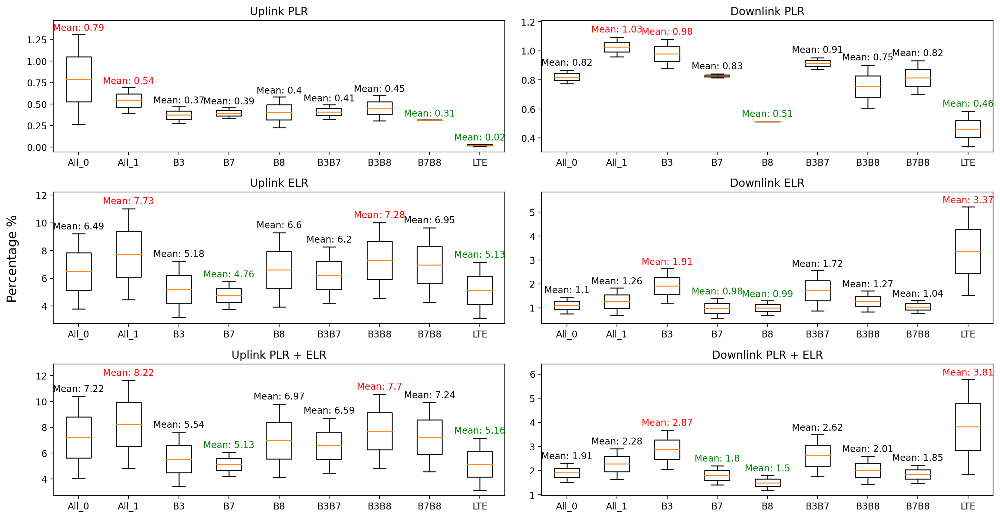

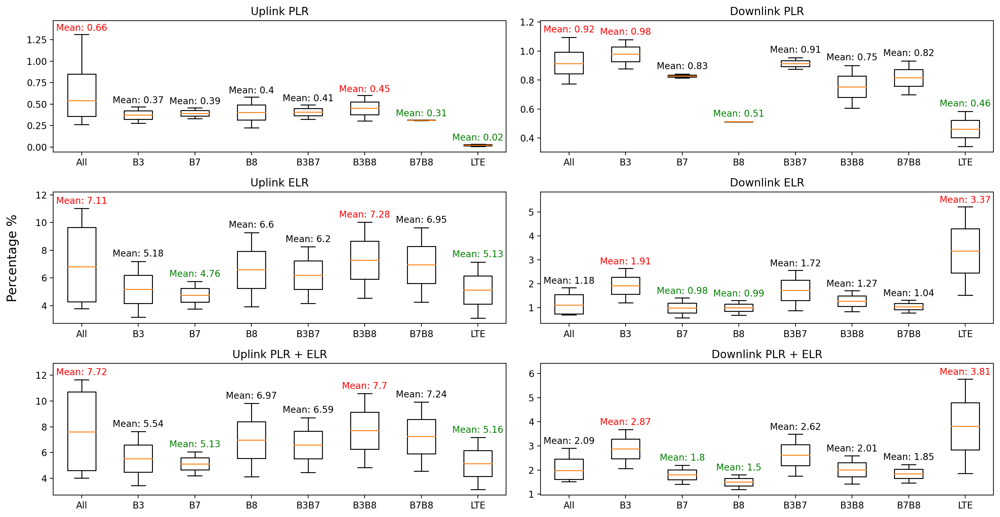

In [149]:
def remove_outliers(data_list):
    # 計算四分位數和四分位距
    Q1, Q3 = np.percentile(data_list, [25, 75])
    IQR = Q3 - Q1
    
    # 計算上下限
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # 去除異常值
    cleaned_list = [x for x in data_list if lower_bound <= x <= upper_bound]
    
    return cleaned_list

def plot_box_plot(ax, title, boxes, labels, top_n=2):
    
    ax.boxplot(boxes, labels=labels)
    ax.set_title(title)
    
    offset = ax.get_ylim()[1] * 0.03
    box_maximals = [max(sub_list) for sub_list in boxes]
    # TODO: remove outliers or not?
    # boxes = [remove_outliers(box_data) for box_data in boxes]
    
    box_means = [np.mean(sub_list) for sub_list in boxes]
    sorted_indices = np.argsort(box_means)
    for k, (mean_value, max_value) in enumerate(zip(box_means, box_maximals)):
        mean_value = round(mean_value, 2)
        
        if k in sorted_indices[:top_n]: # the smallest two schemes
            text_color = 'green'
        elif k in sorted_indices[-top_n:]: # the largest two schemes
            text_color = 'red'
        else:
            text_color = 'black'
            
        ax.text(k + 1, max_value + offset, f'Mean: {mean_value}', ha='center', fontsize=10, color=text_color)
        
    ax.set_ylim(top=ax.get_ylim()[1] * 1.07)

for expr, metrics_dict in zip(exp_list, single_metrics_list):

    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata.iloc[:, :-4])
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']
    
    ### 繪製 Box Plot (1) 對每個 “device” 的數據繪圖
    fig, axes = plt.subplots(3, 2, figsize=(15, 8))
    
    for ax, tag, title in zip(axes.flatten(), tags, titles):
        boxes = [[num for num in v[tag] if num >= 0] for v in metrics_dict.values()]
        labels = add_suffix_to_duplicate_category([expr.setting[k] for k in metrics_dict.keys()])
        
        plot_box_plot(ax, title, boxes, labels)

    fig.text(-0.01, 0.5, 'Percentage %', ha='center', va='center', rotation='vertical', fontsize=14)
    
    plt.tight_layout()
    plt.show()
    
    ### 繪製 Box Plot (2) 將相同 “設定” 不同 “device” 的數據合併繪圖
    fig, axes = plt.subplots(3, 2, figsize=(15, 8))
    
    for ax, tag, title in zip(axes.flatten(), tags, titles):
        new_dict = defaultdict(list)
        for dev, val in metrics_dict.items():
            schm = expr.setting[dev]
            new_dict[schm] += [num for num in val[tag] if num >= 0]

        boxes = list(new_dict.values())
        labels = new_dict.keys()
        
        plot_box_plot(ax, title, boxes, labels)

    fig.text(-0.01, 0.5, 'Percentage %', ha='center', va='center', rotation='vertical', fontsize=14)

    plt.tight_layout()
    plt.show()

## Bar Chart: Per Round

In [150]:
data = {'#01': {'sm00': 8.0, 'sm01': 7.0, 'sm02': 5.0, 'sm03': 1.0, 'sm04': 3.0, 'sm05': 6.0, 'sm06': 2.0, 'sm07': 4.0}, 
 '#02': {'sm00': 5.0, 'sm01': 6.0, 'sm02': 1.0, 'sm03': 3.0, 'sm04': 4.0, 'sm05':  np.nan, 'sm06':  np.nan, 'sm07': 2.0}, 
 '#03': {'sm00': 2.0, 'sm01': 6.0, 'sm02': 8.0, 'sm03': 1.0, 'sm04': 7.0, 'sm05': 3.0, 'sm06': 5.0, 'sm07': 4.0}, 
 '#04': {'sm00': 2.0, 'sm01': 8.0, 'sm02': 7.0, 'sm03': 6.0, 'sm04': 4.0, 'sm05': 3.0, 'sm06': 1.0, 'sm07': 5.0}, 
 '#05': {'sm00': 8.0, 'sm01': 1.0, 'sm02': 4.0, 'sm03': 5.0, 'sm04': 7.0, 'sm05': 6.0, 'sm06': 2.0, 'sm07': 3.0}, 
 '#06': {'sm00': 4.0, 'sm01': 2.0, 'sm02': 3.0, 'sm03': 5.0, 'sm04': 7.0, 'sm05': 1.0, 'sm06': 6.0, 'sm07': 8.0}, 
 'Score': {'sm00': -3, 'sm01': -2, 'sm02': -1, 'sm03': 4, 'sm04': -3, 'sm05': 2, 'sm06': 4, 'sm07': -1}, 
 'Ranking': {'sm00': 7, 'sm01': 6, 'sm02': 4, 'sm03': 1, 'sm04': 8, 'sm05': 3, 'sm06': 2, 'sm07': 5}}

devices = ['sm00', 'sm01', 'sm02', 'sm03', 'sm04', 'sm05', 'sm06', 'sm07']
schemes = ['LTE_0', 'LTE_1', 'B3_0', 'B3_1', 'B7_0', 'B7_1', 'B8_0', 'B8_1']

updated_data = {k: {(dev, schm): v[dev] for dev, schm in zip(devices, schemes)}
                for k, v in data.items()}

# 轉換成 DataFrame 並設置兩層標頭
df = pd.DataFrame(updated_data).T
display(df)

,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07
,LTE_0,LTE_1,B3_0,B3_1,B7_0,B7_1,B8_0,B8_1
#01,8.0,7.0,5.0,1.0,3.0,6.0,2.0,4.0
#02,5.0,6.0,1.0,3.0,4.0,NaN,NaN,2.0
#03,2.0,6.0,8.0,1.0,7.0,3.0,5.0,4.0
#04,2.0,8.0,7.0,6.0,4.0,3.0,1.0,5.0
#05,8.0,1.0,4.0,5.0,7.0,6.0,2.0,3.0
#06,4.0,2.0,3.0,5.0,7.0,1.0,6.0,8.0
Score,-3.0,-2.0,-1.0,4.0,-3.0,2.0,4.0,-1.0
Ranking,7.0,6.0,4.0,1.0,8.0,3.0,2.0,5.0


Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


Uplink PLR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,3,8,4,9,2,7,5,6,1
#02,9,8,4,3,6,5,7,2,1
Score,-2,-2,0,-2,1,0,0,1,4
Ranking,9,8,6,7,3,5,4,2,1


Downlink PLR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,5,9,8,6,2,7,3,4,1
#02,4,9,8,3,1,7,5,6,2
Score,0,-4,-2,0,3,0,0,0,3
Ranking,7,9,8,6,2,5,4,3,1


Uplink ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,4,8,2,3,5,6,9,7,1
#02,5,9,3,1,6,4,8,7,2
Score,0,-3,1,2,0,0,-3,0,3
Ranking,7,9,3,2,6,5,8,4,1


Downlink ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,4,3,8,1,2,7,6,5,9
#02,4,6,8,3,1,7,5,2,9
Score,0,0,-2,2,3,0,0,1,-4
Ranking,7,6,8,2,1,5,4,3,9


Uplink PLR + ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,3,8,2,5,4,6,9,7,1
#02,7,9,3,1,5,4,8,6,2
Score,0,-3,1,2,0,0,-3,0,3
Ranking,7,9,3,2,6,5,8,4,1


Downlink PLR + ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,5,6,9,2,1,7,3,4,8
#02,4,6,8,2,1,7,5,3,9
Score,0,0,-3,2,4,0,0,0,-3
Ranking,7,6,9,2,1,5,4,3,8


2023-10-19 | Bandlock_UDP_9_Phone -> #01


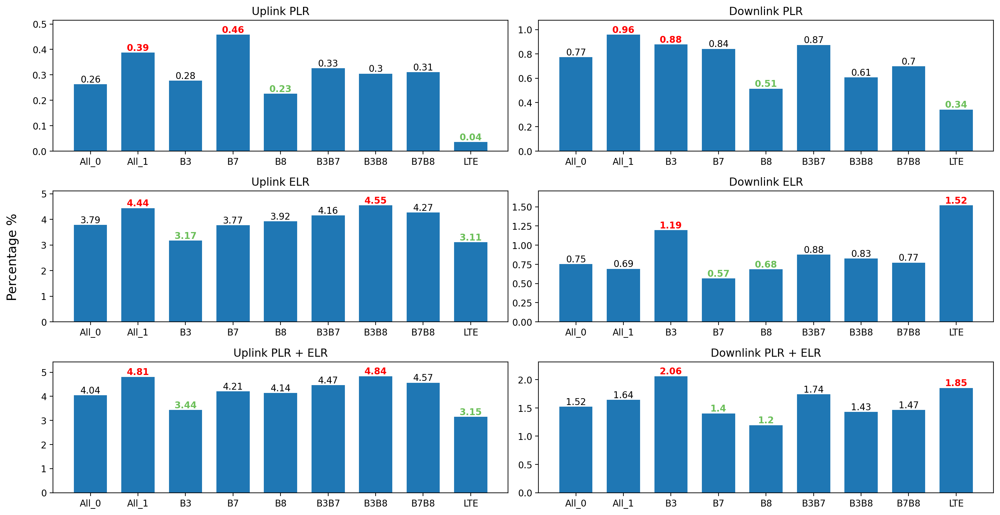

2023-10-19 | Bandlock_UDP_9_Phone -> #02


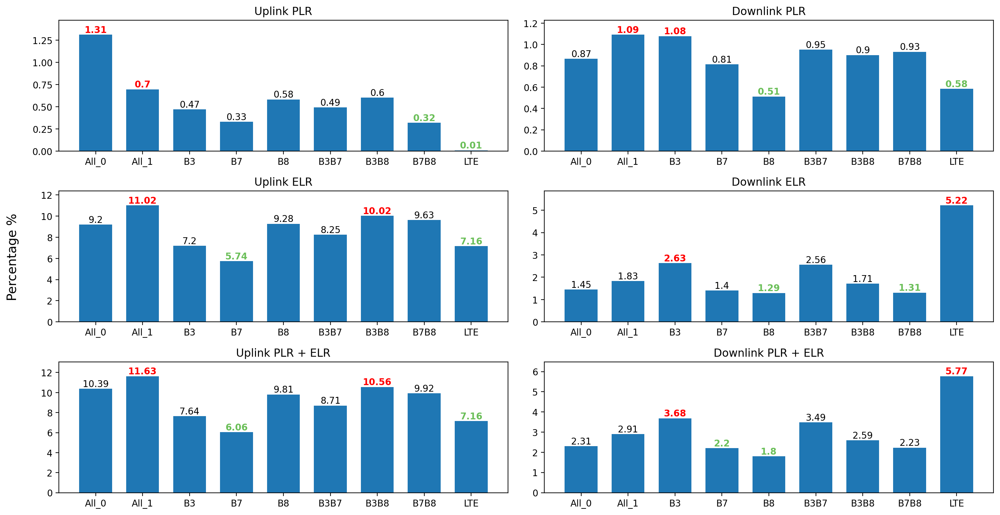

In [151]:
for expr, metrics_dict in zip(exp_list, single_metrics_list):
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata.iloc[:, :-4])
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']

    # Score & Ranking
    devices = expr.setting.keys()
    for tag, title in zip(tags, titles):
        print(f'{title} Ranking:')
        
        data_dict = {k: v[tag] for k, v in metrics_dict.items()}
        ranking_dict = {}
        score_dict = {k: [] for k in devices}
        
        for i, tr in enumerate(expr.traces):
            # print(i, tr)
            data = [v[i] for v in data_dict.values()]
            data = [num if num >= 0 else np.inf for num in data]
            na_indices = [i for i, num in enumerate(data) if np.isinf(num)]
            
            ranking = np.argsort(np.argsort(data)) + 1
            ranking[na_indices] = -1
            ranking_dict[tr] = {k: v for k, v in zip(devices, ranking)}
            
            _ranking = [num for num in ranking if num != -1]
            _max = max(_ranking) if len(_ranking) != 0 else -1; _min = min(_ranking) if len(_ranking) != 0 else -1
            for k, rank in zip(devices, ranking):
                if rank == _min: score_dict[k].append(2)
                elif rank == _min + 1: score_dict[k].append(1)
                elif rank == _max - 1: score_dict[k].append(-1)
                elif rank == _max: score_dict[k].append(-2)
                else: score_dict[k].append(0)
        
        score = [sum(v) for v in score_dict.values()]
        ranking_dict['Score'] = {k: v for k, v in zip(devices, score)}
        
        # 降冪排列
        score_ranking = np.argsort(np.argsort(score)[::-1]) + 1
        ranking_dict['Ranking'] = {k: v for k, v in zip(devices, score_ranking)}
        
        # 轉換成兩層標頭的 DataFrame
        devices = expr.setting.keys()
        schemes = add_suffix_to_duplicate_category(expr.setting.values())
        updated_data = {k: {(dev, schm): v[dev] for dev, schm in zip(devices, schemes)}
                        for k, v in ranking_dict.items()}
        ranking_table = pd.DataFrame(updated_data).T
        
        # 將 -1 改成 pd.NA
        rows_to_check = ranking_table.index[:-2]
        ranking_table.loc[rows_to_check] = ranking_table.loc[rows_to_check].applymap(lambda x: pd.NA if x == -1 else x)
        
        expr.ranking[tag] = ranking_table
        display(ranking_table)
    
    # 建立表格方便製圖
    metrics_table = {}
    
    # 根據字典建立好閱讀的表格
    for tag, title in zip(tags, titles):
        data = {k: [num if num >= 0 else '-' for num in v[tag]] for k, v in metrics_dict.items()}
        metrics_table[tag] = pd.DataFrame(data, index=expr.traces).reset_index().rename(columns={'index': 'Tr.'})
        # print(f'{title} DataFrame:')
        # display(metrics_table[tag])
        
    # 繪製 Bar Charts
    for idx, tr in enumerate(expr.traces):
        print(f'{expr.date} | {expr.name} -> {tr}')
        
        fig, axes = plt.subplots(3, 2, figsize=(15, 8))
        for ax, tag, title in zip(axes.flatten(), tags, titles):
            
            # Sample data including N/A values
            categories = add_suffix_to_duplicate_category([expr.setting[k] for k in metrics_dict.keys()])
            values = [num if num != '-' else np.nan for num in metrics_table[tag].iloc[idx].tolist()[1:]]
            
            # Create a bar chart using ax.bar()
            ax.bar(categories, values, width=0.7)
            ax.set_title(title)
            
            top_n = 2
            min_values = sorted([v for v in values if not np.isnan(v)])[:top_n]
            max_values = sorted([v for v in values if not np.isnan(v)], reverse=True)[:top_n]
            
            for k, v in enumerate(values):
                if not np.isnan(v):
                    label_color = '#6BBF59' if v in min_values else ('red' if v in max_values else 'black')  # '#6BBF59' is green
                    label_fontweight = 'bold' if v in min_values else ('bold' if v in max_values else 'normal')
                    
                    ax.text(k, v, str(round(v, 2)), ha='center', va='bottom', color=label_color, fontweight=label_fontweight)

                if np.isnan(v):
                    ax.text(k, 0, "N/A", ha='center', va='bottom', color='blue', fontweight='bold')
            
            ax.set_ylim(top=ax.get_ylim()[1]*1.07)
        
        fig.text(-0.01, 0.5, 'Percentage %', ha='center', va='center', rotation='vertical', fontsize=14)
    
        plt.tight_layout()
        plt.show()

# Dual Radio

In [152]:
# GLOBAL VARIABLE !!!
dual_metrics_list = []

for expr in exp_list:
    metrics_dict = {}
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    
    # Single Radio
    schemes = add_suffix_to_duplicate_category(expr.setting.values())
    for (dev, ul_paths), dl_paths, schm in tqdm(zip(expr.ul_paths.items(), expr.dl_paths.values(), schemes), ncols=1000):
        # print(dev)
        
        metrics_dict[schm] = {}
        ul_loss_rates, ul_excl_rates, ul_loss_excl_rates = [], [], []
        dl_loss_rates, dl_excl_rates, dl_loss_excl_rates = [], [], []
        
        for i, (ul_path, dl_path) in enumerate(zip(ul_paths, dl_paths)):
            print(i, (ul_path, dl_path))
            ul_loss_rate, ul_excl_rate, ul_loss_excl_rate = calc_loss_excl_rate(ul_path)
            dl_loss_rate, dl_excl_rate, dl_loss_excl_rate = calc_loss_excl_rate(dl_path)
            
            ul_loss_rates.append(ul_loss_rate); ul_excl_rates.append(ul_excl_rate); ul_loss_excl_rates.append(ul_loss_excl_rate)
            dl_loss_rates.append(dl_loss_rate); dl_excl_rates.append(dl_excl_rate); dl_loss_excl_rates.append(dl_loss_excl_rate)
            
        metrics_dict[schm]['ul_loss'] = ul_loss_rates
        metrics_dict[schm]['ul_excl'] = ul_excl_rates
        metrics_dict[schm]['ul_loss_excl'] = ul_loss_excl_rates
        metrics_dict[schm]['dl_loss'] = dl_loss_rates
        metrics_dict[schm]['dl_excl'] = dl_excl_rates
        metrics_dict[schm]['dl_loss_excl'] = dl_loss_excl_rates
    
    # Dual Radio
    devices = list(it.combinations(expr.setting.keys(), 2))
    schemes = list(it.combinations(add_suffix_to_duplicate_category(expr.setting.values()), 2))
    for (dev1, dev2), schm in tqdm(zip(devices, schemes), ncols=1000):
        # print(dev1, dev2)
        schm = '+'.join(schm)
        
        ul_paths1 = expr.ul_paths[dev1]; ul_paths2 = expr.ul_paths[dev2]
        dl_paths1 = expr.dl_paths[dev1]; dl_paths2 = expr.dl_paths[dev2]
        
        metrics_dict[schm] = {}
        ul_loss_rates, ul_excl_rates, ul_loss_excl_rates = [], [], []
        dl_loss_rates, dl_excl_rates, dl_loss_excl_rates = [], [], []
        
        for i, (ul_path1, ul_path2, dl_path1, dl_path2) in enumerate(zip(ul_paths1, ul_paths2, dl_paths1, dl_paths2)):
            print(i, (ul_path1, ul_path2, dl_path1, dl_path2))
            ul_loss_rate, ul_excl_rate, ul_loss_excl_rate = calc_dual_loss_excl_rate(ul_path1, ul_path2)
            dl_loss_rate, dl_excl_rate, dl_loss_excl_rate = calc_dual_loss_excl_rate(dl_path1, dl_path2)
            
            ul_loss_rates.append(ul_loss_rate); ul_excl_rates.append(ul_excl_rate); ul_loss_excl_rates.append(ul_loss_excl_rate)
            dl_loss_rates.append(dl_loss_rate); dl_excl_rates.append(dl_excl_rate); dl_loss_excl_rates.append(dl_loss_excl_rate)
        
        metrics_dict[schm]['ul_loss'] = ul_loss_rates
        metrics_dict[schm]['ul_excl'] = ul_excl_rates
        metrics_dict[schm]['ul_loss_excl'] = ul_loss_excl_rates
        metrics_dict[schm]['dl_loss'] = dl_loss_rates
        metrics_dict[schm]['dl_excl'] = dl_excl_rates
        metrics_dict[schm]['dl_loss_excl'] = dl_loss_excl_rates
    
    dual_metrics_list.append(metrics_dict)
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']
    
    # Display Table
    metrics_table = {}
    
    # 根據字典建立好閱讀的表格
    for tag, title in zip(tags, titles):
        data = {k: [num if num >= 0 else '-' for num in v[tag]] for k, v in metrics_dict.items()}
        metrics_table[tag] = pd.DataFrame(data, index=expr.traces).reset_index().rename(columns={'index': 'Tr.'})
        # print(f'{title} DataFrame:')
        # display(metrics_table[tag])
    
    # Single Ranking
    print('Single Radio Ranking')
    display(expr.metadata.iloc[:, :-4])
    
    # Dual Ranking
    size = len(expr.setting)
    expr.metadata_dual = None
    
    for tag in tags:
        data = [np.mean([num for num in v[tag] if num >= 0]) for v in metrics_dict.values()][size:]
        ranking = np.argsort(np.argsort(data)) + 1

        if expr.metadata_dual is None:
            schemes = metrics_table[tag].columns[1:size+1]
            schm_list = metrics_table[tag].columns[size+1:]
            
            traces = []
            traces_dict = {k: v.split(', ') for k, v in zip(schemes, expr.dev_traces.values())}
            for schms in schm_list:
                schm1 = schms.split('+')[0]; schm2 = schms.split('+')[1]
                traces.append(', '.join(sorted(list(set(traces_dict[schm1]) & set(traces_dict[schm2])))))
            
            expr.metadata_dual = pd.DataFrame({'Schm': schm_list, 'Traces': traces})
        
        expr.metadata_dual[f'avg_{tag}'] = data
        expr.metadata_dual[f'{tag}_rank'] = ranking

    print('Dual Radio Ranking:')
    display(expr.metadata_dual.iloc[:, :-4])

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


0it [00:00, ?it/s]

0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_dnlk_loss_latency.csv')
1 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_dnlk_loss_latency.csv')
0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_dnlk_loss_latency.csv')
1 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_dnlk_loss_latency.csv')
0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-1

0it [00:00, ?it/s]

0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#01/data/udp_dnlk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#01/data/udp_dnlk_loss_latency.csv')
1 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_uplk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm00/#02/data/udp_dnlk_loss_latency.csv', '/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/Bandlock_UDP_9_Phone/sm01/#02/data/udp_dnlk_loss_latency.csv')
0 ('/Users/jackbedford/Desktop/MOXA/Code/data/2023-10-19/B

,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


Dual Radio Ranking:


,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,All_0+All_1,"#01, #02",0.209334,36,0.175077,32,4.834413,35,0.328458,16
1,All_0+B3,"#01, #02",0.131219,28,0.143103,27,3.129533,18,0.311952,13
2,All_0+B7,"#01, #02",0.100108,25,0.082238,20,2.772115,13,0.277425,7
3,All_0+B8,"#01, #02",0.177028,35,0.055895,11,3.962697,29,0.228793,4
4,All_0+B3B7,"#01, #02",0.147003,32,0.202240,35,3.572069,22,0.329689,17
5,All_0+B3B8,"#01, #02",0.151733,34,0.138964,26,4.451637,34,0.301255,11
6,All_0+B7B8,"#01, #02",0.025380,11,0.098383,22,3.940752,28,0.295830,10
7,All_0+LTE,"#01, #02",0.000494,8,0.049976,10,2.174495,5,0.309043,12
8,All_1+B3,"#01, #02",0.134210,29,0.189124,34,3.918908,26,0.434396,29
9,All_1+B7,"#01, #02",0.089244,23,0.134990,25,2.973054,15,0.360803,21


## Heatmap

In [153]:
def annotate_heatmap(data, ax, font_colors, show_upper_triangle=False, show_diag=False):
    rows, cols = data.shape
    for i in range(rows):
        for j in range(cols):
            value = data[i, j]
            
            if not show_upper_triangle and (j > i):
                continue  # Skip upper triangle
            
            if not show_diag and (i == j):
                continue  # Skip main diagonal
            
            if np.isnan(value):
                continue
            
            if font_colors[i, j] == 'green':
                fontweight = 'bold'
                color = '#6BBF59'
            elif font_colors[i, j] == 'red':
                fontweight = 'bold'
                color = 'red'
            else:
                fontweight = 'normal'
                color = 'black'
            
            ax.text(j + 0.5, i + 0.5, f'{value:.3g}', ha='center', va='center', color=color, fontweight=fontweight, fontsize=15.83)

def mask(size, mode='lower', diag=True):
    
    mask = np.ones((size, size))
    if mode == 'lower': # 保留下三角(遮蔽上三角)
        mask[np.tril_indices(size)] = 0
    elif mode == 'upper': # 保留上三角(遮蔽下三角)
        mask[np.triu_indices(size)] = 0
    elif mode == 'square': # 全保留
        mask = np.zeros((size, size))
    else:
        print(f"Warning: mask() has no option '{mode}' for argument: 'mode'.")
        print("Please specify 'upper', 'lower', or 'square' instead.")
    
    if not diag: # 不保留對角線(遮蔽對角線)
        mask[np.diag_indices(size)] = 1

    return mask

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,All_0+All_1,"#01, #02",0.209334,36,0.175077,32,4.834413,35,0.328458,16
1,All_0+B3,"#01, #02",0.131219,28,0.143103,27,3.129533,18,0.311952,13
2,All_0+B7,"#01, #02",0.100108,25,0.082238,20,2.772115,13,0.277425,7
3,All_0+B8,"#01, #02",0.177028,35,0.055895,11,3.962697,29,0.228793,4
4,All_0+B3B7,"#01, #02",0.147003,32,0.202240,35,3.572069,22,0.329689,17
5,All_0+B3B8,"#01, #02",0.151733,34,0.138964,26,4.451637,34,0.301255,11
6,All_0+B7B8,"#01, #02",0.025380,11,0.098383,22,3.940752,28,0.295830,10
7,All_0+LTE,"#01, #02",0.000494,8,0.049976,10,2.174495,5,0.309043,12
8,All_1+B3,"#01, #02",0.134210,29,0.189124,34,3.918908,26,0.434396,29
9,All_1+B7,"#01, #02",0.089244,23,0.134990,25,2.973054,15,0.360803,21


Uplink PLR
sr_best_settings ['B7B8', 'LTE']
sr_worst_settings ['All_0', 'All_1']
dr_best_settings ['All_1+LTE', 'B3+LTE', 'B8+LTE', 'B3B7+LTE', 'B3B8+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B8', 'All_0+B3B8']

Downlink PLR
sr_best_settings ['B8', 'LTE']
sr_worst_settings ['All_1', 'B3']
dr_best_settings ['B7+LTE', 'B8+LTE', 'B3B8+LTE']
dr_worst_settings ['All_1+B3', 'All_0+B3B7', 'All_1+B3B8']

Uplink ELR
sr_best_settings ['B7', 'LTE']
sr_worst_settings ['All_1', 'B3B8']
dr_best_settings ['B7+LTE', 'B8+LTE', 'B3B7+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3B8', 'All_1+B3B8']

Downlink ELR
sr_best_settings ['B7', 'B8']
sr_worst_settings ['B3', 'LTE']
dr_best_settings ['B7+B8', 'B8+B7B8', 'B8+LTE']
dr_worst_settings ['B3+B3B7', 'B3+B3B8', 'B3+LTE']

Uplink PLR + ELR
sr_best_settings ['B7', 'LTE']
sr_worst_settings ['All_1', 'B3B8']
dr_best_settings ['B7+LTE', 'B8+LTE', 'B3B7+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3B8', 'All_1+B3B8']

Downlink PLR + ELR
sr_best_setti

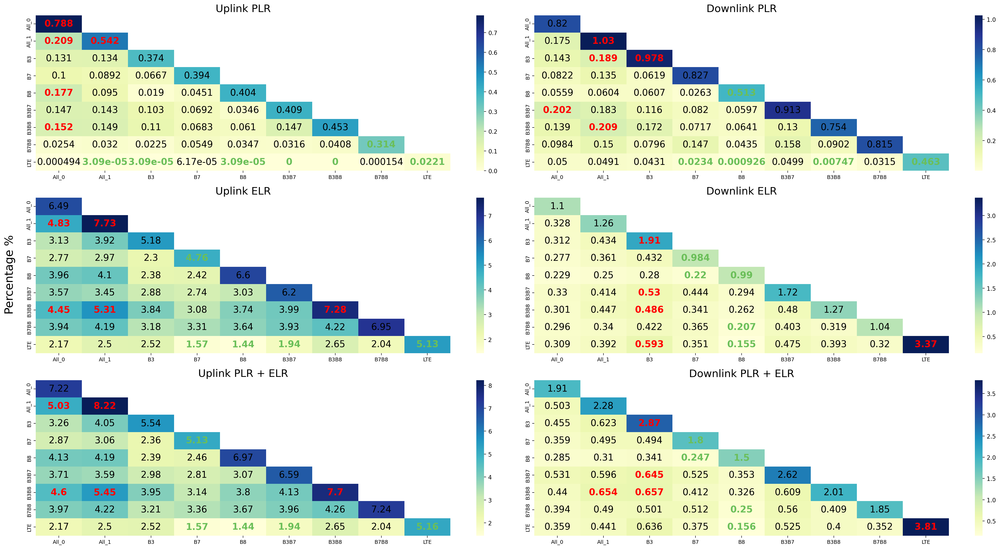

In [154]:
for expr, metrics_dict in zip(exp_list, dual_metrics_list):

    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata.iloc[:, :-4])
    display(expr.metadata_dual.iloc[:, :-4])
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']
    
    # 建立表格方便製圖
    metrics_table = {}
    
    # 根據字典建立好閱讀的表格
    for tag, title in zip(tags, titles):
        data = {k: [num if num >= 0 else '-' for num in v[tag]] for k, v in metrics_dict.items()}
        metrics_table[tag] = pd.DataFrame(data, index=expr.traces).reset_index().rename(columns={'index': 'Tr.'})
        # print(f'{title} DataFrame:')
        # display(metrics_table[tag])
    
    schemes = add_suffix_to_duplicate_category(expr.setting.values())
    combinations = ['+'.join(s) if s[0] != s[1] else s[0] for s in it.product(schemes, repeat=2)]
    
    size = len(expr.setting)
    comb_mapping = np.array(combinations).reshape(size, size).T
    
    # Average
    for ndiag in [False]:
        fig, axes = plt.subplots(3, 2, figsize=(25, 13.33))
        for pos, (tag, title) in enumerate(zip(tags, titles)):
            i = pos // 2; j = pos % 2
            
            data = [np.nanmean([num if num >= 0 else np.nan for num in metrics_dict[comb][tag]]) if comb in metrics_dict else -1 for comb in combinations]
            reshaped_data = np.array(data).reshape(size, size)
            
            axes[i][j].set_title(title, fontsize=18)
            # sns.heatmap(reshaped_data.T, ax=axes[i][j], annot=True, fmt='.3g', mask=mask(size, diag=not ndiag), annot_kws={"size": 15.83}, cmap="YlGnBu")
            sns.heatmap(reshaped_data.T, ax=axes[i][j], annot=False, mask=mask(size, diag=not ndiag), cmap="YlGnBu")
            axes[i][j].set_xticklabels(schemes, fontsize=9)
            axes[i][j].set_yticklabels(schemes, fontsize=9)
            
            # 在相应位置上标注"N/A"
            _mask = mask(size, diag=not ndiag)
            rows, cols = reshaped_data.shape
            for k in range(rows):
                for l in range(cols):
                    if np.isnan(reshaped_data.T[k][l]) and _mask[k][l] == 0:
                        axes[i][j].text(l + 0.5, k + 0.5, "N/A", ha='center', va='center', color='red', fontweight='bold', fontsize=15.83)
            
            # Find the smallest and largest values excluding -1 and np.nan
            valid_values = reshaped_data[(reshaped_data != -1) & (~np.isnan(reshaped_data))]
            smallest_values_valid = np.partition(valid_values, 3)[:3]
            largest_values_valid = np.partition(valid_values, -3)[-3:]

            # Find the smallest and largest values excluding -1, np.nan, and diagonal elements
            mask_diag = np.eye(size, dtype=bool)
            valid_values_no_diag = reshaped_data[~mask_diag & (reshaped_data != -1) & (~np.isnan(reshaped_data))]
            smallest_values_valid_no_diag = np.partition(valid_values_no_diag, 3)[:3]
            largest_values_valid_no_diag = np.partition(valid_values_no_diag, -3)[-3:]

            # Find the smallest and largest values in the main diagonal excluding -1 and np.nan
            valid_diag_values = np.diagonal(reshaped_data)[(np.diagonal(reshaped_data) != -1) & (~np.isnan(np.diagonal(reshaped_data)))]
            smallest_diag_values_valid = np.partition(valid_diag_values, 2)[:2]
            largest_diag_values_valid = np.partition(valid_diag_values, -2)[-2:]
            
            # display(reshaped_data)
            # print(smallest_values_valid)
            # print(largest_values_valid)
            # print(smallest_values_valid_no_diag)
            # print(largest_values_valid_no_diag)
            # print(smallest_diag_values_valid)
            # print(largest_diag_values_valid)
            
            sr_best_settings = []
            dr_best_settings = []
            sr_worst_settings = []
            dr_worst_settings = []
            
            font_colors = np.empty_like(reshaped_data, dtype=object)
            for k in range(rows):
                for l in range(cols):
                    if np.isnan(reshaped_data.T[k][l]) and _mask[k][l] == 0:
                        font_colors[k, l] = 'red'
                    elif np.isnan(reshaped_data.T[k][l]):
                        font_colors[k, l] = 'black'
                    elif reshaped_data.T[k][l] in smallest_values_valid_no_diag:
                        font_colors[k, l] = 'green'
                        dr_best_settings.append(comb_mapping[k][l])
                    elif reshaped_data.T[k][l] in smallest_diag_values_valid:
                        font_colors[k, l] = 'green'
                        sr_best_settings.append(comb_mapping[k][l])
                    elif reshaped_data.T[k][l] in largest_values_valid_no_diag:
                        font_colors[k, l] = 'red'
                        dr_worst_settings.append(comb_mapping[k][l])
                    elif reshaped_data.T[k][l] in largest_diag_values_valid:
                        font_colors[k, l] = 'red'
                        sr_worst_settings.append(comb_mapping[k][l])
                    else:
                        font_colors[k, l] = 'black'
            
            print(title)
            print('sr_best_settings', sr_best_settings)
            print('sr_worst_settings', sr_worst_settings)
            print('dr_best_settings', dr_best_settings)
            print('dr_worst_settings', dr_worst_settings)
            print()

            annotate_heatmap(reshaped_data.T, axes[i][j], font_colors, show_diag=not ndiag)
        
        fig.text(-0.01, 0.5, 'Percentage %', ha='center', va='center', rotation='vertical', fontsize=20)
        
        plt.tight_layout()
        plt.show()
        

## Heatmap: Per Round

Experiment 28: 2023-10-19 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",0.787827,9,0.819602,5,6.493709,5,1.103245,4
1,sm01,All,"#01, #02",0.541577,8,1.025802,9,7.727936,9,1.262918,5
2,sm02,B3,"#01, #02",0.373589,3,0.978055,8,5.183790,3,1.914526,8
3,sm03,B7,"#01, #02",0.394366,4,0.827491,6,4.756156,1,0.984014,1
4,sm04,B8,"#01, #02",0.404158,5,0.512956,2,6.599275,6,0.989649,2
5,sm05,B3B7,"#01, #02",0.408898,6,0.913215,7,6.204583,4,1.719196,7
6,sm06,B3B8,"#01, #02",0.452903,7,0.753760,3,7.284399,8,1.267551,6
7,sm07,B7B8,"#01, #02",0.314225,2,0.815221,4,6.949993,7,1.041146,3
8,sm08,LTE,"#01, #02",0.022073,1,0.462550,1,5.134168,2,3.368943,9


,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,All_0+All_1,"#01, #02",0.209334,36,0.175077,32,4.834413,35,0.328458,16
1,All_0+B3,"#01, #02",0.131219,28,0.143103,27,3.129533,18,0.311952,13
2,All_0+B7,"#01, #02",0.100108,25,0.082238,20,2.772115,13,0.277425,7
3,All_0+B8,"#01, #02",0.177028,35,0.055895,11,3.962697,29,0.228793,4
4,All_0+B3B7,"#01, #02",0.147003,32,0.202240,35,3.572069,22,0.329689,17
5,All_0+B3B8,"#01, #02",0.151733,34,0.138964,26,4.451637,34,0.301255,11
6,All_0+B7B8,"#01, #02",0.025380,11,0.098383,22,3.940752,28,0.295830,10
7,All_0+LTE,"#01, #02",0.000494,8,0.049976,10,2.174495,5,0.309043,12
8,All_1+B3,"#01, #02",0.134210,29,0.189124,34,3.918908,26,0.434396,29
9,All_1+B7,"#01, #02",0.089244,23,0.134990,25,2.973054,15,0.360803,21


Uplink PLR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,3,8,4,9,2,7,5,6,1
#02,9,8,4,3,6,5,7,2,1
Score,-2,-2,0,-2,1,0,0,1,4
Ranking,9,8,6,7,3,5,4,2,1


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,23,11,33,28,25,32,14,3,22,31,17,29,36,19,7,20,9,15,18,10,5,26,34,35,27,4,21,24,13,2,30,16,1,12,6,8
#02,36,34,24,35,33,31,10,8,32,23,25,29,28,9,5,22,12,26,27,13,3,14,19,17,18,6,11,20,16,4,30,15,1,21,2,7
Score,-3,-2,0,-1,0,0,0,1,0,0,0,0,-3,0,0,0,0,0,0,0,1,0,-2,-1,0,0,0,0,0,2,0,0,6,0,2,0
Ranking,36,34,17,32,16,15,14,5,12,13,7,11,35,10,9,8,18,19,20,21,4,30,33,31,29,28,27,26,25,2,24,23,1,22,3,6


sr_best_settings MultiIndex([('sm08',  'LTE'),
            ('sm07', 'B7B8')],
           )
sr_worst_settings MultiIndex([('sm00', 'All_0'),
            ('sm01', 'All_1')],
           )
dr_best_settings Index(['B3B7+LTE', 'B8+LTE', 'B3B8+LTE'], dtype='object')
dr_worst_settings Index(['All_0+All_1', 'All_1+B3B8', 'All_0+B3'], dtype='object')

Downlink PLR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,5,9,8,6,2,7,3,4,1
#02,4,9,8,3,1,7,5,6,2
Score,0,-4,-2,0,3,0,0,0,3
Ranking,7,9,8,6,2,5,4,3,1


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,28,26,19,7,32,24,23,14,35,27,17,34,36,31,16,15,6,20,30,25,13,2,18,12,29,3,10,8,5,1,22,33,9,21,4,11
#02,35,29,14,15,36,30,18,9,31,23,10,33,34,24,8,13,19,25,32,6,5,7,21,22,27,4,17,20,12,2,28,26,11,16,1,3
Score,-1,0,0,0,-3,0,0,0,-1,0,0,-2,-5,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0,5,0,0,0,0,3,1
Ranking,33,16,15,14,35,13,12,10,32,11,9,34,36,8,7,6,17,18,19,28,21,3,22,23,26,5,27,29,30,1,31,20,25,24,2,4


sr_best_settings MultiIndex([('sm08', 'LTE'),
            ('sm04',  'B8')],
           )
sr_worst_settings MultiIndex([('sm01', 'All_1'),
            ('sm02',    'B3')],
           )
dr_best_settings Index(['B8+LTE', 'B3B8+LTE', 'B7+B8'], dtype='object')
dr_worst_settings Index(['All_1+B3B8', 'All_0+B3B7', 'All_1+B3B7'], dtype='object')

Uplink ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,4,8,2,3,5,6,9,7,1
#02,5,9,3,1,6,4,8,7,2
Score,0,-3,1,2,0,0,-3,0,3
Ranking,7,9,3,2,6,5,8,4,1


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,27,10,18,12,23,22,26,8,17,29,20,33,35,32,6,11,9,15,16,14,4,13,25,28,30,3,19,24,21,2,36,34,5,31,7,1
#02,35,20,10,33,22,34,27,9,29,11,32,18,36,30,15,3,7,12,28,21,16,4,6,13,17,2,14,25,23,1,24,26,5,31,19,8
Score,-1,0,0,0,0,-2,0,0,0,0,0,0,-4,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,5,-3,-2,0,0,0,3
Ranking,32,17,16,15,14,33,13,12,10,9,8,7,36,6,5,4,18,19,20,26,31,30,29,28,21,3,27,25,24,1,35,34,23,22,11,2


sr_best_settings MultiIndex([('sm08', 'LTE'),
            ('sm03',  'B7')],
           )
sr_worst_settings MultiIndex([('sm01', 'All_1'),
            ('sm06',  'B3B8')],
           )
dr_best_settings Index(['B8+LTE', 'B7B8+LTE', 'B7+LTE'], dtype='object')
dr_worst_settings Index(['All_1+B3B8', 'B3B7+B3B8', 'B3B7+B7B8'], dtype='object')

Downlink ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,4,3,8,1,2,7,6,5,9
#02,4,6,8,3,1,7,5,2,9
Score,0,0,-2,2,3,0,0,1,-4
Ranking,7,6,8,2,1,5,4,3,9


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,36,27,33,12,32,25,35,2,23,21,17,20,18,19,6,30,5,31,24,29,34,4,28,15,16,3,14,11,9,1,22,26,13,10,7,8
#02,8,11,4,5,12,10,3,20,27,19,7,26,31,17,29,25,14,35,32,24,36,6,28,18,21,23,13,9,1,2,33,22,34,15,30,16
Score,-3,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,-1,0,0,-5,0,0,0,0,1,0,0,3,5,0,0,-2,0,0,0
Ranking,35,30,21,20,32,16,15,3,14,11,12,10,9,8,7,6,17,33,19,18,36,22,23,24,25,4,26,27,2,1,28,29,34,31,13,5


sr_best_settings MultiIndex([('sm04', 'B8'),
            ('sm03', 'B7')],
           )
sr_worst_settings MultiIndex([('sm08', 'LTE'),
            ('sm02',  'B3')],
           )
dr_best_settings Index(['B8+LTE', 'B8+B7B8', 'All_0+LTE'], dtype='object')
dr_worst_settings Index(['B3+LTE', 'All_0+All_1', 'B3B7+LTE'], dtype='object')

Uplink PLR + ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,3,8,2,5,4,6,9,7,1
#02,7,9,3,1,5,4,8,6,2
Score,0,-3,1,2,0,0,-3,0,3
Ranking,7,9,3,2,6,5,8,4,1


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,27,10,18,12,24,22,23,8,17,30,21,34,35,32,6,11,9,15,16,13,4,14,26,28,29,3,20,25,19,2,36,33,5,31,7,1
#02,35,21,10,33,22,34,27,9,31,11,32,20,36,28,15,3,7,13,29,19,16,4,6,12,17,2,14,24,23,1,26,25,5,30,18,8
Score,-1,0,0,0,0,-2,0,0,0,0,0,-2,-4,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,5,-3,0,0,0,0,3
Ranking,32,16,15,14,13,34,12,10,5,9,8,33,36,7,6,4,17,18,19,26,31,30,29,28,20,3,27,25,24,1,35,23,22,21,11,2


sr_best_settings MultiIndex([('sm08', 'LTE'),
            ('sm03',  'B7')],
           )
sr_worst_settings MultiIndex([('sm01', 'All_1'),
            ('sm06',  'B3B8')],
           )
dr_best_settings Index(['B8+LTE', 'B7B8+LTE', 'B7+LTE'], dtype='object')
dr_worst_settings Index(['All_1+B3B8', 'B3B7+B3B8', 'All_0+B3B8'], dtype='object')

Downlink PLR + ELR Ranking:


,sm00,sm01,sm02,sm03,sm04,sm05,sm06,sm07,sm08
,All_0,All_1,B3,B7,B8,B3B7,B3B8,B7B8,LTE
#01,5,6,9,2,1,7,3,4,8
#02,4,6,8,2,1,7,5,3,9
Score,0,0,-3,2,4,0,0,0,-3
Ranking,7,6,9,2,1,5,4,3,8


,All_0+All_1,All_0+B3,All_0+B7,All_0+B8,All_0+B3B7,All_0+B3B8,All_0+B7B8,All_0+LTE,All_1+B3,All_1+B7,All_1+B8,All_1+B3B7,All_1+B3B8,All_1+B7B8,All_1+LTE,B3+B7,B3+B8,B3+B3B7,B3+B3B8,B3+B7B8,B3+LTE,B7+B8,B7+B3B7,B7+B3B8,B7+B7B8,B7+LTE,B8+B3B7,B8+B3B8,B8+B7B8,B8+LTE,B3B7+B3B8,B3B7+B7B8,B3B7+LTE,B3B8+B7B8,B3B8+LTE,B7B8+LTE
#01,36,28,26,11,34,24,31,4,35,22,15,29,32,25,8,17,6,23,30,27,21,3,18,14,19,2,13,10,7,1,20,33,12,16,5,9
#02,14,13,4,5,20,12,6,16,29,23,7,30,33,18,25,24,11,36,34,21,35,3,28,17,26,19,9,8,2,1,32,27,31,15,22,10
Score,-3,0,0,0,-2,0,0,0,-1,0,0,0,0,0,0,0,0,-3,-2,0,-1,2,0,0,0,2,0,0,2,6,0,0,0,0,0,0
Ranking,36,20,19,17,33,16,15,14,32,13,11,10,9,8,7,6,18,35,34,21,31,3,22,23,24,2,25,26,4,1,27,28,29,30,12,5


sr_best_settings MultiIndex([('sm04', 'B8'),
            ('sm03', 'B7')],
           )
sr_worst_settings MultiIndex([('sm02',  'B3'),
            ('sm08', 'LTE')],
           )
dr_best_settings Index(['B8+LTE', 'B7+LTE', 'B7+B8'], dtype='object')
dr_worst_settings Index(['All_0+All_1', 'B3+B3B7', 'B3+B3B8'], dtype='object')

2023-10-19 | Bandlock_UDP_9_Phone -> #01
Uplink PLR
sr_best_settings ['B8', 'LTE']
sr_worst_settings ['All_1', 'B7']
dr_best_settings ['All_0+LTE', 'All_1+LTE', 'B3+LTE', 'B7+LTE', 'B8+LTE', 'B3B7+LTE', 'B3B8+LTE']
dr_worst_settings ['B7+B3B7', 'All_1+B3B8', 'B7+B3B8']

Downlink PLR
sr_best_settings ['B8', 'LTE']
sr_worst_settings ['All_1', 'B3']
dr_best_settings ['B7+B8', 'B7+LTE', 'B8+LTE']
dr_worst_settings ['All_1+B3', 'All_1+B3B7', 'All_1+B3B8']

Uplink ELR
sr_best_settings ['B3', 'LTE']
sr_worst_settings ['All_1', 'B3B8']
dr_best_settings ['B7+LTE', 'B8+LTE', 'B7B8+LTE']
dr_worst_settings ['All_1+B3B8', 'B3B7+B3B8', 'B3B7+B7B8']

Downlink ELR
sr_best_settings

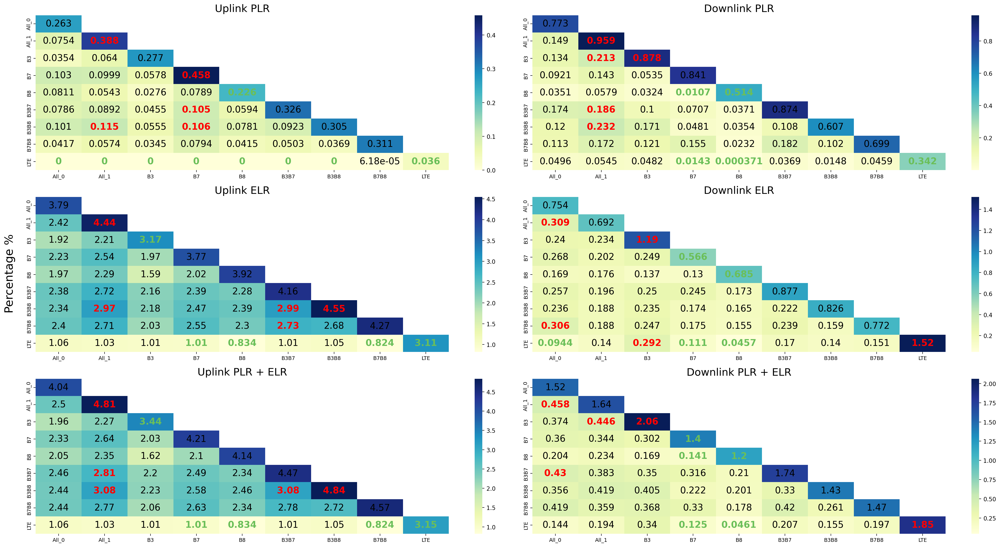

2023-10-19 | Bandlock_UDP_9_Phone -> #02
Uplink PLR
sr_best_settings ['B7B8', 'LTE']
sr_worst_settings ['All_0', 'All_1']
dr_best_settings ['All_1+LTE', 'B3+LTE', 'B8+LTE', 'B3B7+LTE', 'B3B8+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3', 'All_0+B8']

Downlink PLR
sr_best_settings ['B8', 'LTE']
sr_worst_settings ['All_1', 'B3']
dr_best_settings ['B8+LTE', 'B3B8+LTE', 'B7B8+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3B7', 'All_1+B3B8']

Uplink ELR
sr_best_settings ['B7', 'LTE']
sr_worst_settings ['All_1', 'B3B8']
dr_best_settings ['B3+B7', 'B7+LTE', 'B8+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3B8', 'All_1+B3B8']

Downlink ELR
sr_best_settings ['B8', 'B7B8']
sr_worst_settings ['B3', 'LTE']
dr_best_settings ['All_0+B7B8', 'B8+B7B8', 'B8+LTE']
dr_worst_settings ['B3+B3B7', 'B3+LTE', 'B3B7+LTE']

Uplink PLR + ELR
sr_best_settings ['B7', 'LTE']
sr_worst_settings ['All_1', 'B3B8']
dr_best_settings ['B3+B7', 'B7+LTE', 'B8+LTE']
dr_worst_settings ['All_0+All_1', 'All_0+B3B8', '

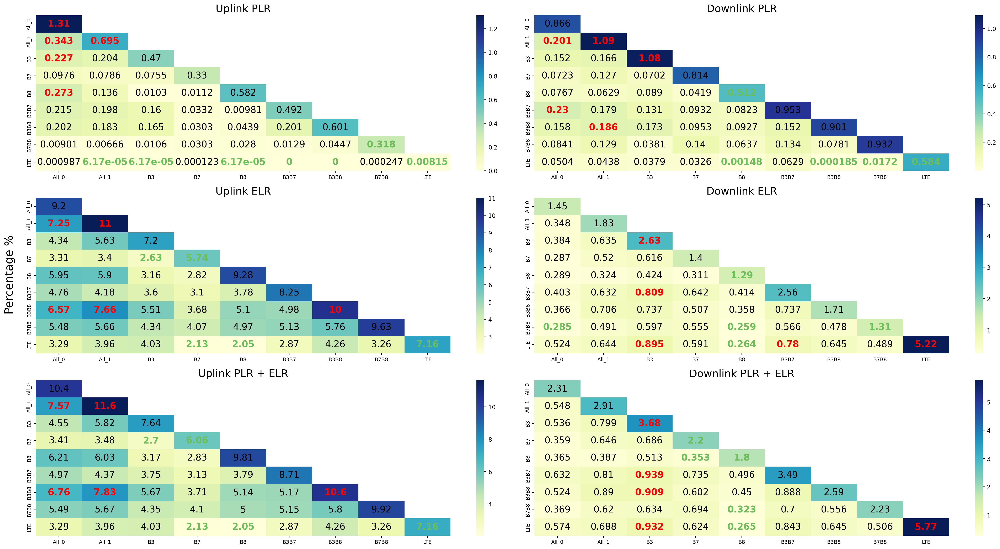

In [155]:
for expr, metrics_dict in zip(exp_list, dual_metrics_list):

    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata.iloc[:, :-4])
    display(expr.metadata_dual.iloc[:, :-4])
    
    tags = ['ul_loss', 'dl_loss', 'ul_excl', 'dl_excl', 'ul_loss_excl', 'dl_loss_excl']
    titles = ['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR']
    
    # 建立表格方便製圖
    metrics_table = {}
    
    # 根據字典建立好閱讀的表格
    for tag, title in zip(tags, titles):
        data = {k: [num if num >= 0 else '-' for num in v[tag]] for k, v in metrics_dict.items()}
        metrics_table[tag] = pd.DataFrame(data, index=expr.traces).reset_index().rename(columns={'index': 'Tr.'})
        # print(f'{title} DataFrame:')
        # display(metrics_table[tag])
    
    size = len(expr.setting)
    schemes = metrics_table[tag].columns[1:size+1]
    schm_list = metrics_table[tag].columns[size+1:]
    for i, (tag, title) in enumerate(zip(tags, titles)):
        print(f'{title} Ranking:')
        
        # Single Radio Ranking
        display(expr.ranking[tag])
        
        # Dual Radio Ranking
        ranking_dict = {}
        data_dict = {k: v[tag] for k, v in metrics_dict.items()}
        score_dict = {k: [] for k in schm_list}
        for i, tr in enumerate(expr.traces):
            
            # print(i, tr)
            data = [v[i] for v in data_dict.values()][size:]
            data = [num if num >= 0 else np.inf for num in data]
            na_indices = [i for i, num in enumerate(data) if np.isinf(num)]
            
            ranking = np.argsort(np.argsort(data)) + 1
            ranking[na_indices] = -1
            ranking_dict[tr] = {k: v for k, v in zip(schm_list, ranking)}
            
            _ranking = [num for num in ranking if num != -1]
            _max = max(_ranking); _min = min(_ranking)
            for k, rank in zip(schm_list, ranking):
                if rank == _min: score_dict[k].append(3)
                elif rank == _min + 1: score_dict[k].append(2)
                elif rank == _min + 2: score_dict[k].append(1)
                elif rank == _max - 1: score_dict[k].append(-1)
                elif rank == _max - 2: score_dict[k].append(-2)
                elif rank == _max: score_dict[k].append(-3)
                else: score_dict[k].append(0)
        
        
        score = [sum(v) for v in score_dict.values()]
        ranking_dict['Score'] = {k: v for k, v in zip(schm_list, score)}
        
        # 降冪排列
        score_ranking = np.argsort(np.argsort(score)[::-1]) + 1
        ranking_dict['Ranking'] = {k: round(v) for k, v in zip(schm_list, score_ranking)}
        ranking_table = pd.DataFrame.from_dict(ranking_dict, orient='index')
        
        # 將 -1 改成 pd.NA
        rows_to_check = ranking_table.index[:-2]
        ranking_table.loc[rows_to_check] = ranking_table.loc[rows_to_check].applymap(lambda x: pd.NA if x == -1 else x)
        
        expr.ranking_dual[tag] = ranking_table
        display(ranking_table)
        
        print('sr_best_settings', expr.ranking[tag].columns[np.argsort(expr.ranking[tag].iloc[-1].array)[:2]])
        print('sr_worst_settings', expr.ranking[tag].columns[np.argsort(expr.ranking[tag].iloc[-1].array)[::-1][:2]])
        print('dr_best_settings', expr.ranking_dual[tag].columns[np.argsort(expr.ranking_dual[tag].iloc[-1].array)[:3]])
        print('dr_worst_settings', expr.ranking_dual[tag].columns[np.argsort(expr.ranking_dual[tag].iloc[-1].array)[::-1][:3]])
        print()
    
    ### Plotting: Per Round
    size = len(expr.setting)
    schemes = add_suffix_to_duplicate_category(expr.setting.values())
    combinations = ['+'.join(s) if s[0] != s[1] else s[0] for s in it.product(schemes, repeat=2)]
    comb_mapping = np.array(combinations).reshape(size, size).T
    for idx, tr in enumerate(expr.traces):
        print(f'{expr.date} | {expr.name} -> {tr}')
        
        for ndiag in [False]:
            fig, axes = plt.subplots(3, 2, figsize=(25, 13.33))
            for pos, (tag, title) in enumerate(zip(tags, titles)):
                i = pos // 2; j = pos % 2
                
                data = [metrics_dict[comb][tag][idx] if comb in metrics_dict else -1 for comb in combinations]
                data = [num if num >= 0 else np.nan for num in data]
                reshaped_data = np.array(data).reshape(size, size)
                
                axes[i][j].set_title(title, fontsize=18)
                # sns.heatmap(reshaped_data.T, ax=axes[i][j], annot=True, fmt='.3g', mask=mask(size, diag=not ndiag), annot_kws={"size": 15.83}, cmap="YlGnBu")
                sns.heatmap(reshaped_data.T, ax=axes[i][j], annot=False, mask=mask(size, diag=not ndiag), cmap="YlGnBu")
                axes[i][j].set_xticklabels(schemes, fontsize=9)
                axes[i][j].set_yticklabels(schemes, fontsize=9)
                
                # 在相应位置上标注"N/A"
                _mask = mask(size, diag=not ndiag)
                rows, cols = reshaped_data.shape
                for k in range(rows):
                    for l in range(cols):
                        if np.isnan(reshaped_data.T[k][l]) and _mask[k][l] == 0:
                            axes[i][j].text(l + 0.5, k + 0.5, "N/A", ha='center', va='center', color='red', fontweight='bold', fontsize=15.83)
                
                # Find the smallest and largest values excluding -1 and np.nan
                valid_values = reshaped_data[(reshaped_data != -1) & (~np.isnan(reshaped_data))]
                smallest_values_valid = np.partition(valid_values, 3)[:3]
                largest_values_valid = np.partition(valid_values, -3)[-3:]

                # Find the smallest and largest values excluding -1, np.nan, and diagonal elements
                mask_diag = np.eye(size, dtype=bool)
                valid_values_no_diag = reshaped_data[~mask_diag & (reshaped_data != -1) & (~np.isnan(reshaped_data))]
                smallest_values_valid_no_diag = np.partition(valid_values_no_diag, 3)[:3]
                largest_values_valid_no_diag = np.partition(valid_values_no_diag, -3)[-3:]

                # Find the smallest and largest values in the main diagonal excluding -1 and np.nan
                valid_diag_values = np.diagonal(reshaped_data)[(np.diagonal(reshaped_data) != -1) & (~np.isnan(np.diagonal(reshaped_data)))]
                smallest_diag_values_valid = np.partition(valid_diag_values, 2)[:2]
                largest_diag_values_valid = np.partition(valid_diag_values, -2)[-2:]
                
                # display(reshaped_data)
                # print(smallest_values_valid)
                # print(largest_values_valid)
                # print(smallest_values_valid_no_diag)
                # print(largest_values_valid_no_diag)
                # print(smallest_diag_values_valid)
                # print(largest_diag_values_valid)
                
                sr_best_settings = []
                dr_best_settings = []
                sr_worst_settings = []
                dr_worst_settings = []
                
                font_colors = np.empty_like(reshaped_data, dtype=object)
                for k in range(rows):
                    for l in range(cols):
                        if np.isnan(reshaped_data.T[k][l]) and _mask[k][l] == 0:
                            font_colors[k, l] = 'red'
                        elif np.isnan(reshaped_data.T[k][l]):
                            font_colors[k, l] = 'black'
                        elif reshaped_data.T[k][l] in smallest_values_valid_no_diag:
                            font_colors[k, l] = 'green'
                            dr_best_settings.append(comb_mapping[k][l])
                        elif reshaped_data.T[k][l] in smallest_diag_values_valid:
                            font_colors[k, l] = 'green'
                            sr_best_settings.append(comb_mapping[k][l])
                        elif reshaped_data.T[k][l] in largest_values_valid_no_diag:
                            font_colors[k, l] = 'red'
                            dr_worst_settings.append(comb_mapping[k][l])
                        elif reshaped_data.T[k][l] in largest_diag_values_valid:
                            font_colors[k, l] = 'red'
                            sr_worst_settings.append(comb_mapping[k][l])
                        else:
                            font_colors[k, l] = 'black'

                annotate_heatmap(reshaped_data.T, axes[i][j], font_colors, show_diag=not ndiag)
                
                print(title)
                print('sr_best_settings', sr_best_settings)
                print('sr_worst_settings', sr_worst_settings)
                print('dr_best_settings', dr_best_settings)
                print('dr_worst_settings', dr_worst_settings)
                print()
            
            fig.text(-0.01, 0.5, 'Percentage %', ha='center', va='center', rotation='vertical', fontsize=20)
            
            plt.tight_layout()
            plt.show()

# Trace Inspector (Plotting)

(1) 2個radio 的 packet loss 不同顏色疊在一起

(2) 兩者的 Latency （100ms 為閾值）

(3) 2個radio 的 handover 的發生時間，上為 radio 1，下為 radio 2，數字標間隔時間

(4) 兩者的 serving RSRP (PCI, band 變化，上為 radio 1) 最強的兩個 neighboring RSRP

(5) 兩者的 serving NR RSRP (PCI, band 變化，下為 radio 2) 最強的兩個 neighboring RSRP

(PCI1, EARFCN1, NRPCI1) -> (PCI2, EARFCN2, NRPCI2)

In [76]:
all_path = namedtuple('all_path', ['rrc_path', 'lte_path', 'nr_path', 'ul_path', 'dl_path'])

def find_selected_filepath(id, tr, dev):
    try:
        index = look_up_table[id]
        # print(f'Exp ({id}, {dev}, {tr}) look up succeed!')
    except:
        id_not_found = 1
        for i, expr in enumerate(exp_list):
            if "{:02d}".format(id) == expr.id:
                id_not_found = 0
                look_up_table[id] = i
                index = i
                break
        if id_not_found:
            print(f'Exp id: {id} not found!')
            return '','','','',''
            
    if isinstance(tr, str):
        tr_index = exp_list[index].traces.index(tr)
    else:
        tr_index = tr
    
    rrc_path = exp_list[index].rrc_paths[dev][tr_index]
    lte_path = exp_list[index].lte_paths[dev][tr_index]
    nr_path = exp_list[index].nr_paths[dev][tr_index]
    ul_path = exp_list[index].ul_paths[dev][tr_index]
    dl_path = exp_list[index].dl_paths[dev][tr_index]
    
    return all_path(rrc_path, lte_path, nr_path, ul_path, dl_path)

def find_expr_instance(id):
    try:
        index = look_up_table[id]
        # print(f'Exp ({id}, {dev}, {tr}) look up succeed!')
    except:
        id_not_found = 1
        for i, expr in enumerate(exp_list):
            if "{:02d}".format(id) == expr.id:
                id_not_found = 0
                look_up_table[id] = i
                index = i
                break
        if id_not_found:
            print(f'Exp id: {id} not found!')
            return '','','','',''
    
    return exp_list[index]

def check_scheme(id, dev):
    try:
        index = look_up_table[id]
        # print(f'Exp ({id}, {dev}, {tr}) look up succeed!')
    except:
        id_not_found = 1
        for i, expr in enumerate(exp_list):
            if "{:02d}".format(id) == expr.id:
                id_not_found = 0
                look_up_table[id] = i
                index = i
                break
        if id_not_found:
            print(f'Exp id: {id} not found!')
            return '','','','',''
    
    my_dict = {k: v for k, v in zip(exp_list[index].setting.keys(), add_suffix_to_duplicate_category(exp_list[index].setting.values()))}
    
    return my_dict[dev]

## Dual Radio

In [77]:
for expr in exp_list:
    print(f'Experiment {expr.id}: {expr.date} | {expr.name} -> {expr.traces}')
    display(expr.metadata.iloc[:, :-4])

Experiment 29: 2023-10-26 | Bandlock_UDP_9_Phone -> ['#01', '#02']


,Device,Schm,Traces,avg_ul_loss,ul_loss_rank,avg_dl_loss,dl_loss_rank,avg_ul_excl,ul_excl_rank,avg_dl_excl,dl_excl_rank
0,sm00,All,"#01, #02",1.839858,7,1.602152,4,10.016991,9,1.875324,5
1,sm01,All,"#01, #02",1.596787,5,2.128111,6,8.053614,5,1.554660,3
2,sm02,B3,"#01, #02",0.700029,2,2.185400,7,8.382407,6,1.930500,6
3,sm03,B7,"#01, #02",1.274938,4,5.333047,9,7.911437,4,1.452914,1
4,sm04,B8,"#01, #02",2.578370,9,0.892656,2,7.465930,2,1.952279,7
5,sm05,B3B7,"#01, #02",0.959898,3,2.230014,8,7.909315,3,2.292544,8
6,sm06,B3B8,"#01, #02",1.726683,6,2.083483,5,10.014506,8,1.522455,2
7,sm07,B7B8,"#01, #02",1.845690,8,1.405982,3,9.134680,7,1.604745,4
8,sm08,LTE,"#01, #02",0.489430,1,0.443776,1,5.435546,1,2.851112,9


In [78]:
# TODO: Select Traces
expr_id = 29; expr_tr = '#01'; expr = find_expr_instance(expr_id)
dev1 = 'sm03'; schm1 = check_scheme(expr_id, dev1)
dev2 = 'sm04'; schm2 = check_scheme(expr_id, dev2)

# dev1 = 'sm00'; schm1 = check_scheme(expr_id, dev1)
# dev2 = 'sm06'; schm2 = check_scheme(expr_id, dev2)

print(expr)
print(expr_tr)
print(dev1, schm1)
print(dev2, schm2)

Experiment 29: ./2023-10-26/Bandlock_UDP_9_Phone -> {'sm00': 'All', 'sm01': 'All', 'sm02': 'B3', 'sm03': 'B7', 'sm04': 'B8', 'sm05': 'B3B7', 'sm06': 'B3B8', 'sm07': 'B7B8', 'sm08': 'LTE'}
#01
sm03 B7
sm04 B8


In [79]:
dfs = {'ho': [], 'lte': [], 'nr': [], 'ul': [], 'dl': []}
filepath1 = find_selected_filepath(expr_id, expr_tr, dev1)
filepath2 = find_selected_filepath(expr_id, expr_tr, dev2)

file_not_exist = False
for path1, path2, key in zip(filepath1, filepath2, dfs.keys()):
    print(key)
    print(dev1, expr_tr, path1)
    print(dev2, expr_tr, path2)
    if not (os.path.isfile(path1) and os.path.isfile(path2)):
        file_not_exist = True
        dfs[key].append(pd.DataFrame())
        dfs[key].append(pd.DataFrame())
    else:
        df1 = pd.read_pickle(path1) if path1.endswith('.pkl') else pd.read_csv(path1)
        df2 = pd.read_pickle(path2) if path2.endswith('.pkl') else pd.read_csv(path2)
        if key in ['ho']:
            df1, _, _ = mi_parse_ho(df1, tz=8)
            df2, _, _ = mi_parse_ho(df2, tz=8)
            df1['ho_type0'] = df1['ho_type'].astype('string')
            df2['ho_type0'] = df2['ho_type'].astype('string')
            df1.loc[df1['cause'].notna(), 'ho_type0'] = df1['ho_type'].astype('string') + '_' + df1['cause'].astype('string')
            df2.loc[df2['cause'].notna(), 'ho_type0'] = df2['ho_type'].astype('string') + '_' + df2['cause'].astype('string')
            df1['ho_type0'] = df1['ho_type0'].astype('category')
            df2['ho_type0'] = df2['ho_type0'].astype('category')
        elif key in ['lte', 'nr']:
            df1 = set_data(df1, mode=key, tz=8)
            df2 = set_data(df2, mode=key, tz=8)
        else:
            df1 = set_data(df1)
            df2 = set_data(df2)

        dfs[key].append(df1)
        dfs[key].append(df2)

if file_not_exist:
    print('\nFile not exist!!')
    
else:
    for key in ['ul', 'dl']:
        st_seq = max([dfs[key][0]['seq'].array[0], dfs[key][1]['seq'].array[0]])
        ed_seq = min([dfs[key][0]['seq'].array[-1], dfs[key][1]['seq'].array[-1]])
        dfs[key][0] = dfs[key][0][(dfs[key][0]['seq'] >= st_seq) & (dfs[key][0]['seq'] <= ed_seq)].reset_index(drop=True)
        dfs[key][1] = dfs[key][1][(dfs[key][1]['seq'] >= st_seq) & (dfs[key][1]['seq'] <= ed_seq)].reset_index(drop=True)

    st_time = min(dfs['ul'][0]['Timestamp'].array[0], dfs['ul'][1]['Timestamp'].array[0], dfs['dl'][0]['Timestamp'].array[0], dfs['dl'][1]['Timestamp'].array[0])
    ed_time = min(dfs['ul'][0]['Timestamp'].array[-1], dfs['ul'][1]['Timestamp'].array[-1], dfs['dl'][0]['Timestamp'].array[-1], dfs['dl'][1]['Timestamp'].array[-1])
    for key in ['ho', 'lte', 'nr']:
        dfs[key][0] = dfs[key][0][(dfs[key][0]['Timestamp'] > st_time) & (dfs[key][0]['Timestamp'] < ed_time)].reset_index(drop=True)
        dfs[key][1] = dfs[key][1][(dfs[key][1]['Timestamp'] > st_time) & (dfs[key][1]['Timestamp'] < ed_time)].reset_index(drop=True)

ho
sm03 #01 /Users/jackbedford/Desktop/MOXA/Code/data/2023-10-26/Bandlock_UDP_9_Phone/sm03/#01/data/diag_log_sm03_2023-10-26_13-30-26_rrc.csv
sm04 #01 /Users/jackbedford/Desktop/MOXA/Code/data/2023-10-26/Bandlock_UDP_9_Phone/sm04/#01/data/diag_log_sm04_2023-10-26_13-30-25_rrc.csv
************** Empty DataFrame!! **************


KeyError: 'start'

In [75]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(dfs['ho'][0])

""


### Uplink Downlink

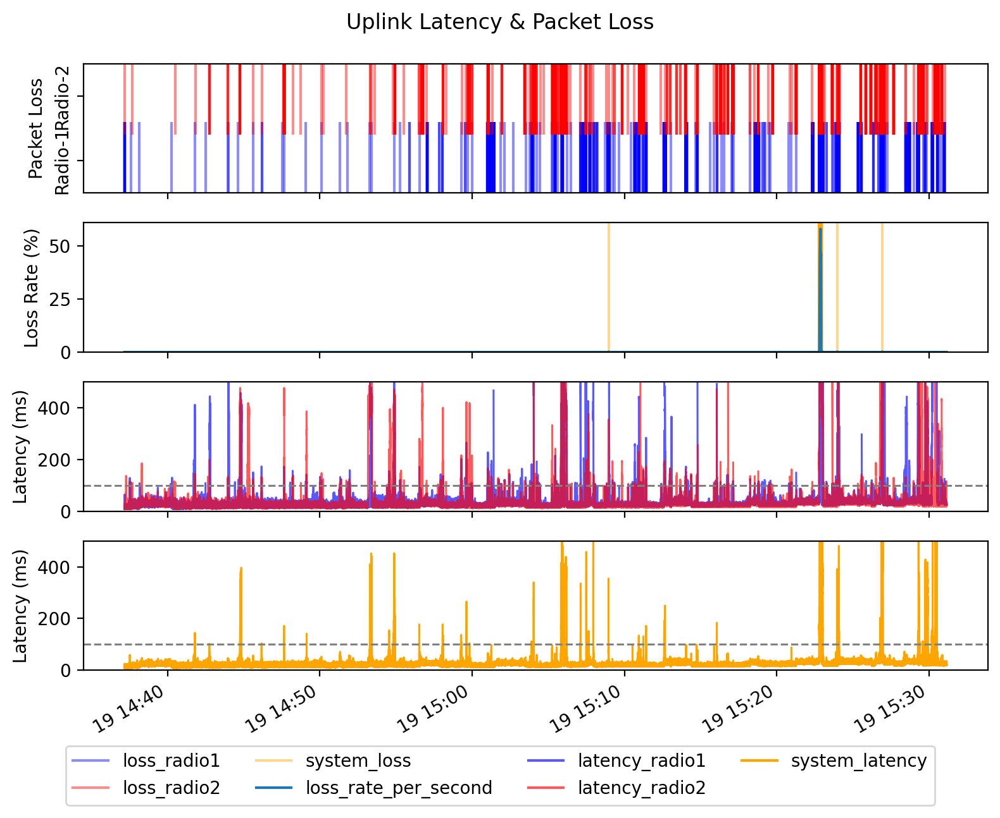

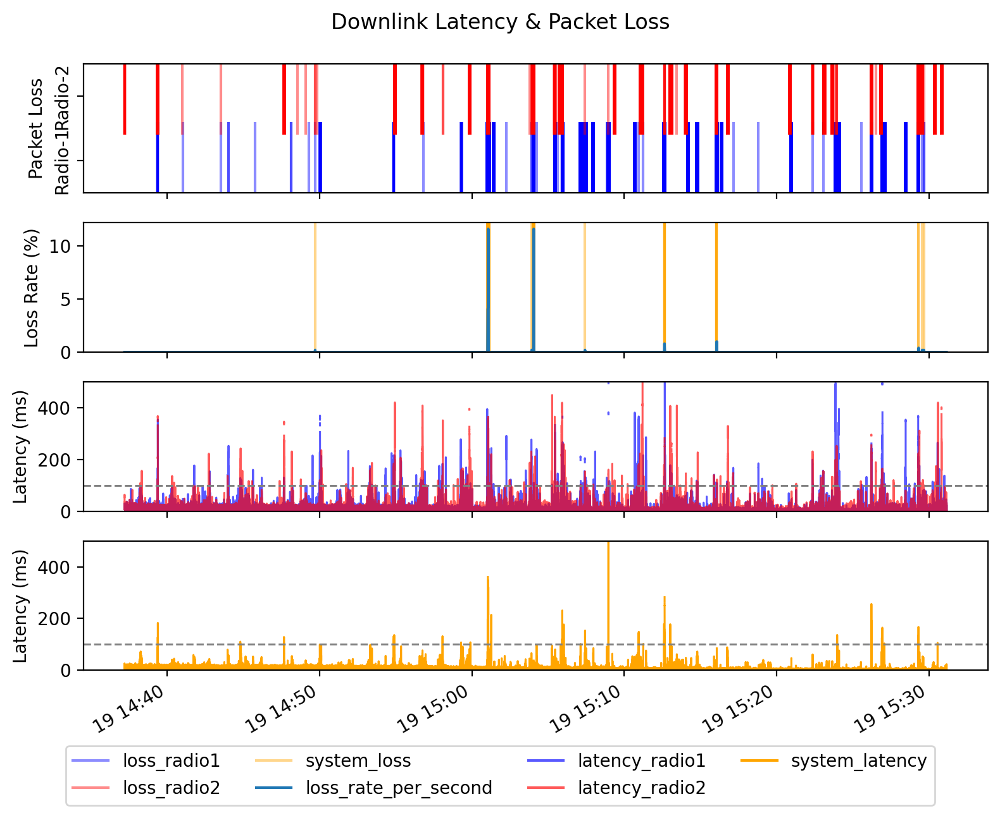

In [41]:
def plot_latency_loss(df1, df2, excl_threshold, title):
    fig, axes = plt.subplots(4, 1, figsize=(8, 6), sharex=True)
    legend_lines = []
    legend_labels = []

    def add_legend_lines(ax, label, color, alpha=1):
        line = ax.plot([], [], color=color, alpha=alpha)[0]
        legend_lines.append(line)
        legend_labels.append(label)

    ### Packet Loss
    loss1 = df1.loc[df1['lost'], "Timestamp"].iloc[:]
    loss2 = df2.loc[df2['lost'], "Timestamp"].iloc[:]
    loss = df1.loc[df1['lost'] & df2['lost'], "Timestamp"].iloc[:]

    axes[0].vlines(loss1, ymin=0, ymax=0.55, color='b', alpha=0.45)
    axes[0].vlines(loss2, ymin=0.45, ymax=1, color='r', alpha=0.45)
    axes[0].set_ylim(0, 1)
    axes[0].set_yticks([0.25, 0.75])
    axes[0].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')
    axes[0].set_ylabel('Packet Loss')

    df = df1.merge(df2, on='seq').rename(columns={'Timestamp_x': 'Timestamp'}).reset_index(drop=True).copy()
    df['lost'] = df['lost_x'] & df['lost_y']
    df = df[['Timestamp', 'lost']]
    df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.round('1s')

    lost_rate_per_second = (df.groupby('Timestamp')['lost'].mean() * 100).reset_index()
    timestamp = lost_rate_per_second['Timestamp'].iloc[:]
    lost_rate = lost_rate_per_second['lost'].iloc[:]

    axes[1].vlines(loss, ymin=0, ymax=100, color='orange', alpha=0.45)
    axes[1].plot(timestamp, lost_rate)
    axes[1].set_ylim(0, max(min(max(lost_rate) * 1.05, 100), 1))
    axes[1].set_ylabel('Loss Rate (%)')
    
    add_legend_lines(axes[0], 'loss_radio1', 'b', 0.45)
    add_legend_lines(axes[0], 'loss_radio2', 'r', 0.45)
    add_legend_lines(axes[1], 'system_loss', 'orange', 0.45)
    add_legend_lines(axes[1], 'loss_rate_per_second', 'tab:blue')

    ### Latency
    timestamp1 = df1["Timestamp"].iloc[:]
    latency1 = df1["latency"].iloc[:].astype(float) * 1e3
    timestamp2 = df2["Timestamp"].iloc[:]
    latency2 = df2["latency"].iloc[:].astype(float) * 1e3

    latency_min = np.minimum(latency1, latency2)

    axes[2].plot(timestamp1, latency1, linewidth=1.1, color='b', alpha=0.65)
    axes[2].plot(timestamp2, latency2, linewidth=1.1, color='r', alpha=0.65)
    axes[3].plot(timestamp1, latency_min, linewidth=1.1, color='orange')
        
    for ax in [axes[2], axes[3]]:
        ax.set_ylim(0, 500)
        ax.axhline(y=excl_threshold, color='gray', linestyle='--', linewidth=1.1)
    
    add_legend_lines(axes[2], 'latency_radio1', 'b', 0.65)
    add_legend_lines(axes[2], 'latency_radio2', 'r', 0.65)
    add_legend_lines(axes[3], 'system_latency', 'orange')

    axes[2].set_ylabel('Latency (ms)')
    axes[3].set_ylabel('Latency (ms)')
    # fig.text(0, (axes[2].get_position().y1 + axes[3].get_position().y0) / 2, \
    #     'milliseconds', ha='center', va='center', rotation='vertical', fontsize=10)

    fig.legend(legend_lines, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.025), fancybox=True, ncol=4)
    fig.suptitle(title)
    plt.gcf().autofmt_xdate()
    plt.tight_layout()
    plt.show()

# Call the function for uplink and downlink
plot_latency_loss(dfs['ul'][0].copy(), dfs['ul'][1].copy(), 100, 'Uplink Latency & Packet Loss')
plot_latency_loss(dfs['dl'][0].copy(), dfs['dl'][1].copy(), 100, 'Downlink Latency & Packet Loss')

### LTE Handover

/var/folders/vy/w6g3hxgj76s0gzty27t2d6gm0000gn/T/ipykernel_13079/1001584981.py:99: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


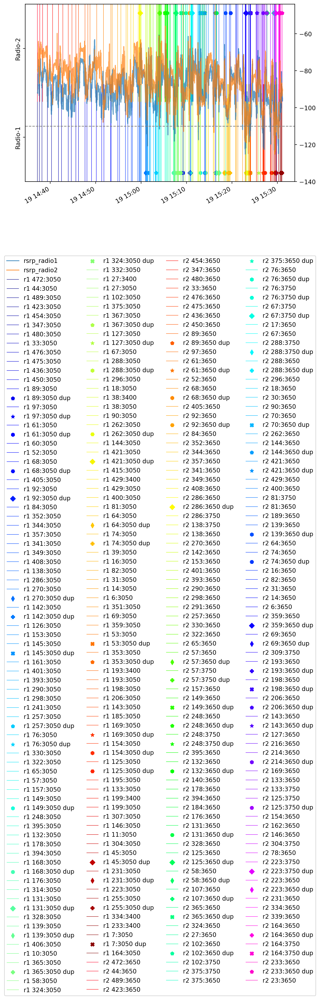

In [42]:
df1 = dfs['lte'][0].copy()
df2 = dfs['lte'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot([], [], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax.plot([], [], color='tab:orange', alpha=0.7, label='rsrp_radio2')

ax_twinx = ax.twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')
ax_twinx.set_ylim(-140, -44)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_EARFCN'] = df['EARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['EARFCN'] != df['prev_EARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_EARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'EARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

ax.set_ylim(0, 1)
ax.set_yticks([0.25, 0.75])
ax.set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup')
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup')
        k += 1

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), fancybox=True, ncol=4)

# fig.text(0, (ax.get_position().y0 + ax.get_position().y1) / 2, \
#         'radio 1', ha='center', va='center', rotation='vertical', fontsize=10)

# Show the plot
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()

### NR Handover

/var/folders/vy/w6g3hxgj76s0gzty27t2d6gm0000gn/T/ipykernel_13079/1083199628.py:99: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


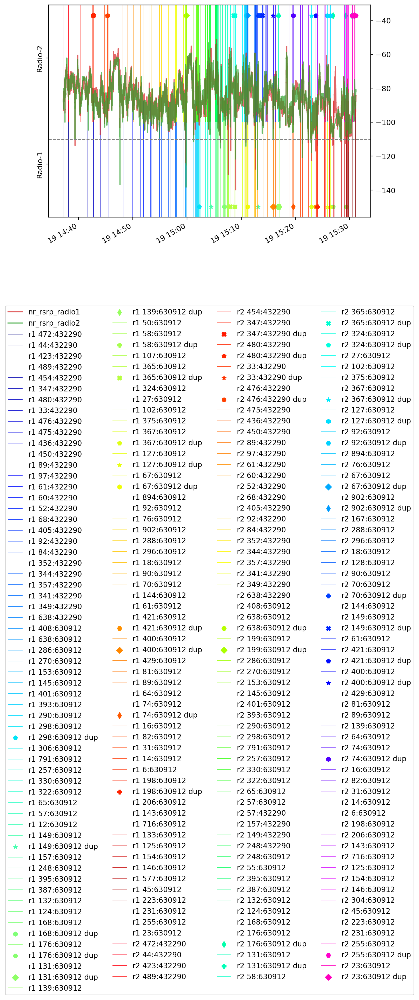

In [43]:
df1 = dfs['nr'][0].copy()
df2 = dfs['nr'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot([], [], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax.plot([], [], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')

ax_twinx = ax.twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
ax_twinx.set_ylim(-156, -31)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_NR_ARFCN'] = df['NR_ARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['NR_ARFCN'] != df['prev_NR_ARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_NR_ARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'NR_ARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

ax.set_ylim(0, 1)
ax.set_yticks([0.25, 0.75])
ax.set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup')
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup')
        k += 1

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), fancybox=True, ncol=4)

# fig.text(0, (ax.get_position().y0 + ax.get_position().y1) / 2, \
#         'radio 1', ha='center', va='center', rotation='vertical', fontsize=10)

# Show the plot
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()

### Handover Policy

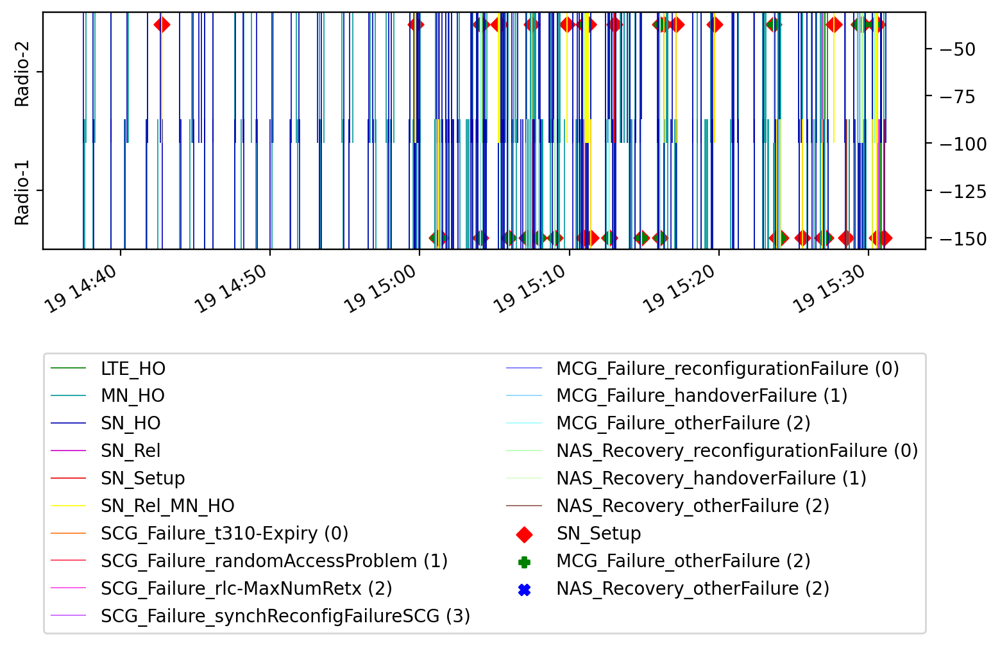

In [44]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

ax_twinx = ax.twinx()
ax_twinx.set_ylim(-156, -31)

# ax.plot([], [], color='tab:blue', alpha=0.7, label='rsrp_radio1')
# ax.plot([], [], color='tab:orange', alpha=0.7, label='rsrp_radio2')
# ax.plot([], [], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
# ax.plot([], [], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')

# df1 = dfs['lte'][0].copy()
# df2 = dfs['lte'][1].copy()

# df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
# df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
# ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')
# ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

# df1 = dfs['nr'][0].copy()
# df2 = dfs['nr'][1].copy()

# df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
# df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
# ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
# ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

df1 = dfs['ho'][0].copy()
df2 = dfs['ho'][1].copy()

handovers = ['LTE_HO','MN_HO','SN_HO','SN_Rel','SN_Setup','SN_Rel_MN_HO',
          'SCG_Failure_t310-Expiry (0)','SCG_Failure_randomAccessProblem (1)','SCG_Failure_rlc-MaxNumRetx (2)','SCG_Failure_synchReconfigFailureSCG (3)',
          'MCG_Failure_reconfigurationFailure (0)','MCG_Failure_handoverFailure (1)','MCG_Failure_otherFailure (2)',
          'NAS_Recovery_reconfigurationFailure (0)','NAS_Recovery_handoverFailure (1)','NAS_Recovery_otherFailure (2)']

colors = ['#008000', '#009999', '#0000B3', '#CC00CC', '#E60000', '#FFFF02', '#FF7216', '#FF2C4B', '#FF43EA', '#C459FF', '#6F6FFF', '#85D6FF', '#9BFFFF', '#B2FFB2', '#D9FFC8', 'tab:brown']
cdict3 = {handover: color for handover, color in zip(handovers, colors)}

ax.set_ylim(0, 1)
ax.set_yticks([0.25, 0.75])
ax.set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

for handover in handovers:
    ax.vlines([], [], [], color=cdict3[handover], linewidth=0.7, alpha=0.85, label=handover)

for handover in handovers:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict3[handover], linewidth=0.7, alpha=0.85)
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        ax.vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict3[handover], linewidth=0.7, alpha=0.85)


handovers_subset = [
    'SN_Setup','MCG_Failure_otherFailure (2)','NAS_Recovery_otherFailure (2)'
]

colors = ['r', 'g', 'b']
cdict4 = {handover: color for handover, color in zip(handovers_subset, colors)}

markers = ['D', 'P', 'X']
mdict = {handover: marker for handover, marker in zip(handovers_subset, markers)}

for handover in handovers_subset:
    ax.scatter([], [], c=cdict4[handover], marker=mdict[handover], label=handover)

for handover in handovers_subset:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict4[handover], marker=mdict[handover])
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        ax.scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict4[handover], marker=mdict[handover])

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), fancybox=True, ncol=2)

# fig.text(0, (ax.get_position().y0 + ax.get_position().y1) / 2, \
#         'radio 1', ha='center', va='center', rotation='vertical', fontsize=10)

# Show the plot
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()

### All Plots # Uplink

,Uplink PLR,Uplink ELR,Uplink PLR + ELR
Radio1,0.458,3.768,4.209
Radio2,0.226,3.922,4.139
System,0.079,2.019,2.096


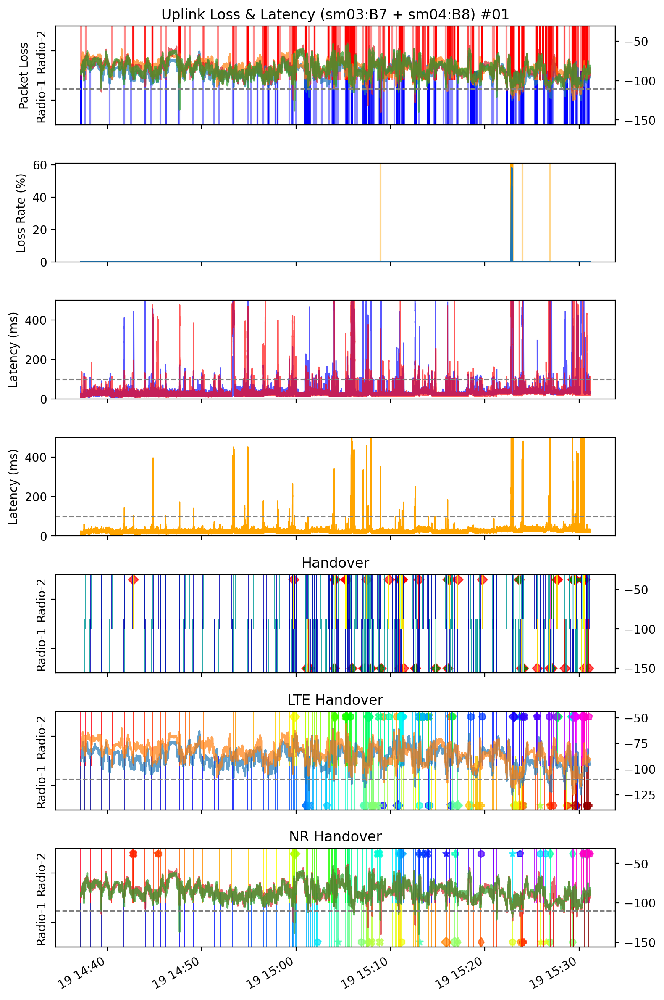

/var/folders/vy/w6g3hxgj76s0gzty27t2d6gm0000gn/T/ipykernel_13079/3288719863.py:458: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


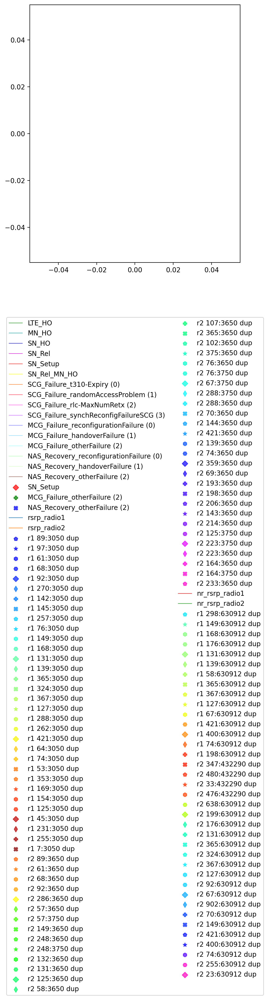

In [45]:
# table = pd.DataFrame(columns=['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR'])
table = pd.DataFrame(columns=['Uplink PLR', 'Uplink ELR', 'Uplink PLR + ELR'])

ul_loss, ul_excl, ul_loss_excl = calc_loss_excl_rate(dfs['ul'][0].copy())
dl_loss, dl_excl, dl_loss_excl = calc_loss_excl_rate(dfs['dl'][0].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('radio1 - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['Radio1'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['Radio1'] = [ul_loss, ul_excl, ul_loss_excl]

ul_loss, ul_excl, ul_loss_excl = calc_loss_excl_rate(dfs['ul'][1].copy())
dl_loss, dl_excl, dl_loss_excl = calc_loss_excl_rate(dfs['dl'][1].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('radio2 - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['Radio2'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['Radio2'] = [ul_loss, ul_excl, ul_loss_excl]

ul_loss, ul_excl, ul_loss_excl = calc_dual_loss_excl_rate(dfs['ul'][0].copy(), dfs['ul'][1].copy())
dl_loss, dl_excl, dl_loss_excl = calc_dual_loss_excl_rate(dfs['dl'][0].copy(), dfs['dl'][1].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('system - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['System'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['System'] = [ul_loss, ul_excl, ul_loss_excl]

display(table)


######################## Uplink Loss & Latency (4 plots)
fig, axes = plt.subplots(7, 1, figsize=(8, 12), sharex=True)

df1 = dfs['ul'][0].copy()
df2 = dfs['ul'][1].copy()

excl_threshold = 100

### Packet Loss
loss1 = df1.loc[df1['lost'], "Timestamp"].iloc[:]
loss2 = df2.loc[df2['lost'], "Timestamp"].iloc[:]
loss = df1.loc[df1['lost'] & df2['lost'], "Timestamp"].iloc[:]

axes[0].vlines(loss1, ymin=0, ymax=0.55, color='b', alpha=0.45)
axes[0].vlines(loss2, ymin=0.45, ymax=1, color='r', alpha=0.45)
axes[0].set_ylim(0, 1)
axes[0].set_yticks([0.25, 0.75])
axes[0].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')
axes[0].set_ylabel('Packet Loss')

df = df1.merge(df2, on='seq').rename(columns={'Timestamp_x': 'Timestamp'}).reset_index(drop=True).copy()
df['lost'] = df['lost_x'] & df['lost_y']
df = df[['Timestamp', 'lost']]
df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.round('1s')

lost_rate_per_second = (df.groupby('Timestamp')['lost'].mean() * 100).reset_index()
timestamp = lost_rate_per_second['Timestamp'].iloc[:]
lost_rate = lost_rate_per_second['lost'].iloc[:]

axes[1].vlines(loss, ymin=0, ymax=100, color='orange', alpha=0.45)
axes[1].plot(timestamp, lost_rate)
axes[1].set_ylim(0, max(min(max(lost_rate) * 1.05, 100), 1))
axes[1].set_ylabel('Loss Rate (%)')

### Latency
timestamp1 = df1["Timestamp"].iloc[:]
latency1 = df1["latency"].iloc[:].astype(float) * 1e3
timestamp2 = df2["Timestamp"].iloc[:]
latency2 = df2["latency"].iloc[:].astype(float) * 1e3

latency_min = np.minimum(latency1, latency2)

axes[2].plot(timestamp1, latency1, linewidth=1.1, color='b', alpha=0.65)
axes[2].plot(timestamp2, latency2, linewidth=1.1, color='r', alpha=0.65)
axes[3].plot(timestamp1, latency_min, linewidth=1.1, color='orange')
    
for ax in [axes[2], axes[3]]:
    ax.set_ylim(0, 500)
    ax.axhline(y=excl_threshold, color='gray', linestyle='--', linewidth=1.1)

axes[2].set_ylabel('Latency (ms)')
axes[3].set_ylabel('Latency (ms)')
# fig.text(0, (axes[2].get_position().y1 + axes[3].get_position().y0) / 2, \
#     'milliseconds', ha='center', va='center', rotation='vertical', fontsize=10)

axes[0].set_title(f'Uplink Loss & Latency ({dev1}:{schm1} + {dev2}:{schm2}) {expr_tr}')

ax_twinx = axes[0].twinx()
ax_twinx.set_ylim(-156, -31)

df1 = dfs['lte'][0].copy()
df2 = dfs['lte'][1].copy()
df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')

df1 = dfs['nr'][0].copy()
df2 = dfs['nr'][1].copy()
df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')

ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

# plt.gcf().autofmt_xdate()
# plt.tight_layout()
# plt.show()


# ######################## Downlink Loss & Latency (4 plots)
# fig, axes = plt.subplots(4, 1, figsize=(8, 6), sharex=True)

# df1 = dfs['dl'][0].copy()
# df2 = dfs['dl'][1].copy()

# excl_threshold = 100

# ### Packet Loss
# loss1 = df1.loc[df1['lost'], "Timestamp"].iloc[:]
# loss2 = df2.loc[df2['lost'], "Timestamp"].iloc[:]
# loss = df1.loc[df1['lost'] & df2['lost'], "Timestamp"].iloc[:]

# axes[0].vlines(loss1, ymin=0, ymax=0.55, color='b', alpha=0.45)
# axes[0].vlines(loss2, ymin=0.45, ymax=1, color='r', alpha=0.45)
# axes[0].set_ylim(0, 1)
# axes[0].set_yticks([0.25, 0.75])
# axes[0].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')
# axes[0].set_ylabel('Packet Loss')

# df = df1.merge(df2, on='seq').rename(columns={'Timestamp_x': 'Timestamp'}).reset_index(drop=True).copy()
# df['lost'] = df['lost_x'] & df['lost_y']
# df = df[['Timestamp', 'lost']]
# df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.round('1s')

# lost_rate_per_second = (df.groupby('Timestamp')['lost'].mean() * 100).reset_index()
# timestamp = lost_rate_per_second['Timestamp'].iloc[:]
# lost_rate = lost_rate_per_second['lost'].iloc[:]

# axes[1].vlines(loss, ymin=0, ymax=100, color='orange', alpha=0.45)
# axes[1].plot(timestamp, lost_rate)
# axes[1].set_ylim(0, max(min(max(lost_rate) * 1.05, 100), 1))
# axes[1].set_ylabel('Loss Rate (%)')

# ### Latency
# timestamp1 = df1["Timestamp"].iloc[:]
# latency1 = df1["latency"].iloc[:].astype(float) * 1e3
# timestamp2 = df2["Timestamp"].iloc[:]
# latency2 = df2["latency"].iloc[:].astype(float) * 1e3

# latency_min = np.minimum(latency1, latency2)

# axes[2].plot(timestamp1, latency1, linewidth=1.1, color='b', alpha=0.65)
# axes[2].plot(timestamp2, latency2, linewidth=1.1, color='r', alpha=0.65)
# axes[3].plot(timestamp1, latency_min, linewidth=1.1, color='orange')
    
# for ax in [axes[2], axes[3]]:
#     ax.set_ylim(0, 500)
#     ax.axhline(y=excl_threshold, color='gray', linestyle='--', linewidth=1.1)

# axes[2].set_ylabel('Latency (ms)')
# axes[3].set_ylabel('Latency (ms)')
# # fig.text(0, (axes[6].get_position().y1 + axes[7].get_position().y0) / 2, \
# #     'milliseconds', ha='center', va='center', rotation='vertical', fontsize=10)

# axes[0].set_title('Downlink Loss & Latency')

# plt.gcf().autofmt_xdate()
# plt.tight_layout()
# plt.show()


legend_list = []

######################## Handover Policy (1 plot)
# fig, axes = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

ax_twinx = axes[4].twinx()
ax_twinx.set_ylim(-156, -31)

df1 = dfs['ho'][0].copy()
df2 = dfs['ho'][1].copy()

handovers = ['LTE_HO','MN_HO','SN_HO','SN_Rel','SN_Setup','SN_Rel_MN_HO',
          'SCG_Failure_t310-Expiry (0)','SCG_Failure_randomAccessProblem (1)','SCG_Failure_rlc-MaxNumRetx (2)','SCG_Failure_synchReconfigFailureSCG (3)',
          'MCG_Failure_reconfigurationFailure (0)','MCG_Failure_handoverFailure (1)','MCG_Failure_otherFailure (2)',
          'NAS_Recovery_reconfigurationFailure (0)','NAS_Recovery_handoverFailure (1)','NAS_Recovery_otherFailure (2)']

colors = ['#008000', '#009999', '#0000B3', '#CC00CC', '#E60000', '#FFFF02', '#FF7216', '#FF2C4B', '#FF43EA', '#C459FF', '#6F6FFF', '#85D6FF', '#9BFFFF', '#B2FFB2', '#D9FFC8', 'tab:brown']
cdict3 = {handover: color for handover, color in zip(handovers, colors)}

for handover in handovers:
    legend_list.append(('line', handover, cdict3[handover], 0.85, None, 0.7))

axes[4].set_ylim(0, 1)
axes[4].set_yticks([0.25, 0.75])
axes[4].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

for handover in handovers:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict3[handover], linewidth=0.7, alpha=0.85)
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict3[handover], linewidth=0.7, alpha=0.85)


handovers_subset = [
    'SN_Setup','MCG_Failure_otherFailure (2)','NAS_Recovery_otherFailure (2)'
]

colors = ['r', 'g', 'b']
cdict4 = {handover: color for handover, color in zip(handovers_subset, colors)}

markers = ['D', 'P', 'X']
mdict = {handover: marker for handover, marker in zip(handovers_subset, markers)}

for handover in handovers_subset:
    legend_list.append(('scatter', handover, cdict4[handover], 0.7, mdict[handover], 1.1))

for handover in handovers_subset:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict4[handover], marker=mdict[handover], alpha=0.7)
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict4[handover], marker=mdict[handover], alpha=0.7)

axes[4].set_title('Handover')


######################## LTE Handover (1 plot)

df1 = dfs['lte'][0].copy()
df2 = dfs['lte'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# axes[1].plot([], [], color='tab:blue', alpha=0.7, label='rsrp_radio1')
# axes[1].plot([], [], color='tab:orange', alpha=0.7, label='rsrp_radio2')

legend_list.append(('line', 'rsrp_radio1', 'tab:blue', 0.7, None, 1.1))
legend_list.append(('line', 'rsrp_radio2', 'tab:orange', 0.7, None, 1.1))

ax_twinx = axes[5].twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')
ax_twinx.set_ylim(-140, -44)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_EARFCN'] = df['EARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['EARFCN'] != df['prev_EARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_EARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'EARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

axes[5].set_ylim(0, 1)
axes[5].set_yticks([0.25, 0.75])
axes[5].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[5].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        axes[5].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r1 {pci_earfcn} dup', cdict1[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[5].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        axes[5].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r2 {pci_earfcn} dup', cdict2[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

axes[5].set_title('LTE Handover')


######################## NR Handover (1 plot)

df1 = dfs['nr'][0].copy()
df2 = dfs['nr'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# axes[2].plot([], [], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
# axes[2].plot([], [], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
legend_list.append(('line', 'nr_rsrp_radio1', 'tab:red', 0.7, None, 1.1))
legend_list.append(('line', 'nr_rsrp_radio2', 'tab:green', 0.7, None, 1.1))

ax_twinx = axes[6].twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
ax_twinx.set_ylim(-156, -31)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_NR_ARFCN'] = df['NR_ARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['NR_ARFCN'] != df['prev_NR_ARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_NR_ARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'NR_ARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

axes[6].set_ylim(0, 1)
axes[6].set_yticks([0.25, 0.75])
axes[6].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[6].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        axes[6].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r1 {pci_earfcn} dup', cdict1[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[6].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        axes[6].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r2 {pci_earfcn} dup', cdict2[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1
        
axes[6].set_title('NR Handover')

plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


######################## Legends Show
def add_legend(ax, style, label, color, alpha=1, marker=None, linewidth=1.1):
    if style == 'line':
        plot = ax.plot([], [], color=color, alpha=alpha, linewidth=linewidth)[0]
    else:
        plot = ax.scatter([], [], c=color, alpha=alpha, marker=marker)
        
    legend_lines.append(plot)
    legend_labels.append(label)

fig, ax = plt.subplots(figsize=(5.7, 7), sharex=True)

legend_lines, legend_labels = [], []

for item in legend_list:
    # print(item)
    add_legend(ax, *item)

ax.legend(legend_lines, legend_labels, loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, ncol=2)
plt.tight_layout()
plt.show()

### All Plots # Downlink

,Downlink PLR,Downlink ELR,Downlink PLR + ELR
Radio1,0.841,0.566,1.403
Radio2,0.514,0.685,1.195
System,0.011,0.130,0.141


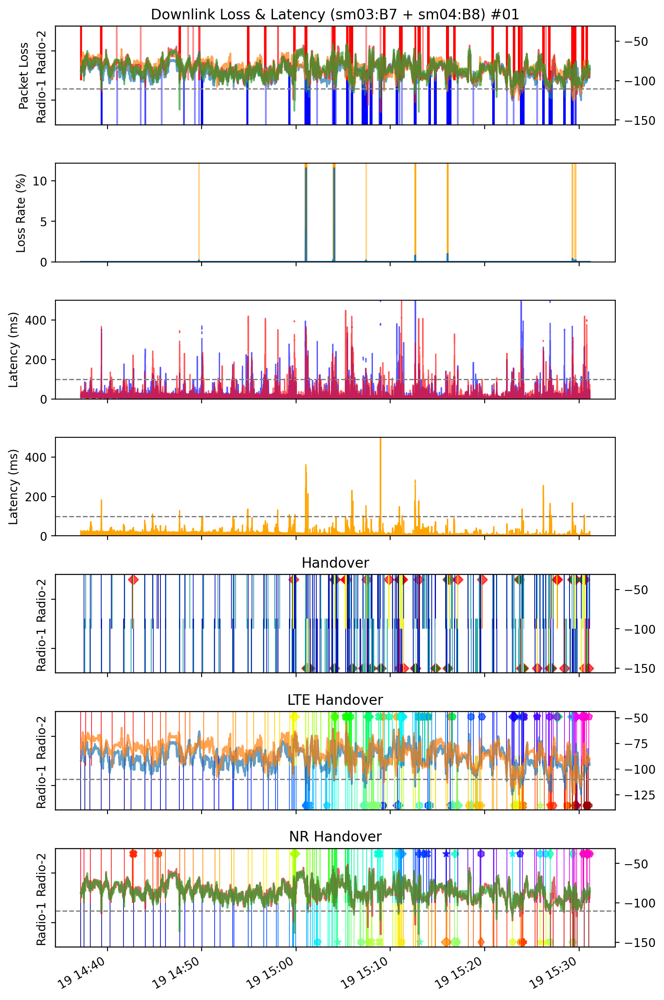

/var/folders/vy/w6g3hxgj76s0gzty27t2d6gm0000gn/T/ipykernel_13079/2990924990.py:458: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


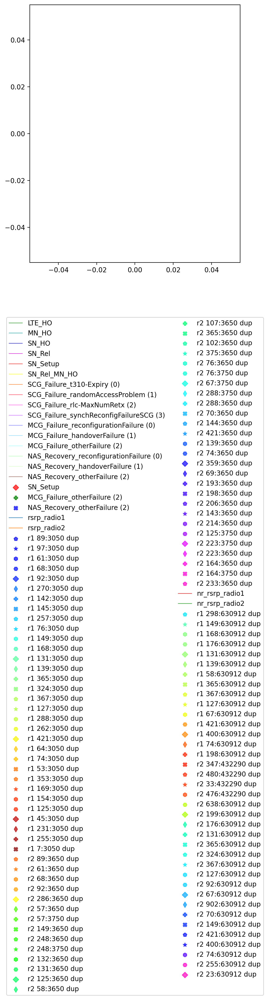

In [46]:
# table = pd.DataFrame(columns=['Uplink PLR', 'Downlink PLR', 'Uplink ELR', 'Downlink ELR', 'Uplink PLR + ELR', 'Downlink PLR + ELR'])
table = pd.DataFrame(columns=['Downlink PLR', 'Downlink ELR', 'Downlink PLR + ELR'])

ul_loss, ul_excl, ul_loss_excl = calc_loss_excl_rate(dfs['ul'][0].copy())
dl_loss, dl_excl, dl_loss_excl = calc_loss_excl_rate(dfs['dl'][0].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('radio1 - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['Radio1'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['Radio1'] = [dl_loss, dl_excl, dl_loss_excl]

ul_loss, ul_excl, ul_loss_excl = calc_loss_excl_rate(dfs['ul'][1].copy())
dl_loss, dl_excl, dl_loss_excl = calc_loss_excl_rate(dfs['dl'][1].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('radio2 - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['Radio2'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['Radio2'] = [dl_loss, dl_excl, dl_loss_excl]

ul_loss, ul_excl, ul_loss_excl = calc_dual_loss_excl_rate(dfs['ul'][0].copy(), dfs['ul'][1].copy())
dl_loss, dl_excl, dl_loss_excl = calc_dual_loss_excl_rate(dfs['dl'][0].copy(), dfs['dl'][1].copy())
ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl = round(ul_loss, 3), round(ul_excl, 3), round(ul_loss_excl, 3), round(dl_loss, 3), round(dl_excl, 3), round(dl_loss_excl, 3)
# print('system - ul loss, ul excl, ul loss + excl, dl loss, dl excl, dl loss + excl:', ul_loss, ul_excl, ul_loss_excl, dl_loss, dl_excl, dl_loss_excl)
# table.loc['System'] = [ul_loss, dl_loss, ul_excl, dl_excl, dl_loss_excl, ul_loss_excl]
table.loc['System'] = [dl_loss, dl_excl, dl_loss_excl]

display(table)


# ######################## Uplink Loss & Latency (4 plots)
# fig, axes = plt.subplots(4, 1, figsize=(8, 6), sharex=True)

# df1 = dfs['ul'][0].copy()
# df2 = dfs['ul'][1].copy()

# excl_threshold = 100

# ### Packet Loss
# loss1 = df1.loc[df1['lost'], "Timestamp"].iloc[:]
# loss2 = df2.loc[df2['lost'], "Timestamp"].iloc[:]
# loss = df1.loc[df1['lost'] & df2['lost'], "Timestamp"].iloc[:]

# axes[0].vlines(loss1, ymin=0, ymax=0.55, color='b', alpha=0.45)
# axes[0].vlines(loss2, ymin=0.45, ymax=1, color='r', alpha=0.45)
# axes[0].set_ylim(0, 1)
# axes[0].set_yticks([0.25, 0.75])
# axes[0].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')
# axes[0].set_ylabel('Packet Loss')

# df = df1.merge(df2, on='seq').rename(columns={'Timestamp_x': 'Timestamp'}).reset_index(drop=True).copy()
# df['lost'] = df['lost_x'] & df['lost_y']
# df = df[['Timestamp', 'lost']]
# df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.round('1s')

# lost_rate_per_second = (df.groupby('Timestamp')['lost'].mean() * 100).reset_index()
# timestamp = lost_rate_per_second['Timestamp'].iloc[:]
# lost_rate = lost_rate_per_second['lost'].iloc[:]

# axes[1].vlines(loss, ymin=0, ymax=100, color='orange', alpha=0.45)
# axes[1].plot(timestamp, lost_rate)
# axes[1].set_ylim(0, max(min(max(lost_rate) * 1.05, 100), 1))
# axes[1].set_ylabel('Loss Rate (%)')

# ### Latency
# timestamp1 = df1["Timestamp"].iloc[:]
# latency1 = df1["latency"].iloc[:].astype(float) * 1e3
# timestamp2 = df2["Timestamp"].iloc[:]
# latency2 = df2["latency"].iloc[:].astype(float) * 1e3

# latency_min = np.minimum(latency1, latency2)

# axes[2].plot(timestamp1, latency1, linewidth=1.1, color='b', alpha=0.65)
# axes[2].plot(timestamp2, latency2, linewidth=1.1, color='r', alpha=0.65)
# axes[3].plot(timestamp1, latency_min, linewidth=1.1, color='orange')
    
# for ax in [axes[2], axes[3]]:
#     ax.set_ylim(0, 500)
#     ax.axhline(y=excl_threshold, color='gray', linestyle='--', linewidth=1.1)

# axes[2].set_ylabel('Latency (ms)')
# axes[3].set_ylabel('Latency (ms)')
# # fig.text(0, (axes[2].get_position().y1 + axes[3].get_position().y0) / 2, \
# #     'milliseconds', ha='center', va='center', rotation='vertical', fontsize=10)

# axes[0].set_title('Uplink Loss & Latency')

# plt.gcf().autofmt_xdate()
# plt.tight_layout()
# plt.show()


######################## Downlink Loss & Latency (4 plots)
fig, axes = plt.subplots(7, 1, figsize=(8, 12), sharex=True)

df1 = dfs['dl'][0].copy()
df2 = dfs['dl'][1].copy()

excl_threshold = 100

### Packet Loss
loss1 = df1.loc[df1['lost'], "Timestamp"].iloc[:]
loss2 = df2.loc[df2['lost'], "Timestamp"].iloc[:]
loss = df1.loc[df1['lost'] & df2['lost'], "Timestamp"].iloc[:]

axes[0].vlines(loss1, ymin=0, ymax=0.55, color='b', alpha=0.45)
axes[0].vlines(loss2, ymin=0.45, ymax=1, color='r', alpha=0.45)
axes[0].set_ylim(0, 1)
axes[0].set_yticks([0.25, 0.75])
axes[0].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')
axes[0].set_ylabel('Packet Loss')

df = df1.merge(df2, on='seq').rename(columns={'Timestamp_x': 'Timestamp'}).reset_index(drop=True).copy()
df['lost'] = df['lost_x'] & df['lost_y']
df = df[['Timestamp', 'lost']]
df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.round('1s')

lost_rate_per_second = (df.groupby('Timestamp')['lost'].mean() * 100).reset_index()
timestamp = lost_rate_per_second['Timestamp'].iloc[:]
lost_rate = lost_rate_per_second['lost'].iloc[:]

axes[1].vlines(loss, ymin=0, ymax=100, color='orange', alpha=0.45)
axes[1].plot(timestamp, lost_rate)
axes[1].set_ylim(0, max(min(max(lost_rate) * 1.05, 100), 1))
axes[1].set_ylabel('Loss Rate (%)')

### Latency
timestamp1 = df1["Timestamp"].iloc[:]
latency1 = df1["latency"].iloc[:].astype(float) * 1e3
timestamp2 = df2["Timestamp"].iloc[:]
latency2 = df2["latency"].iloc[:].astype(float) * 1e3

latency_min = np.minimum(latency1, latency2)

axes[2].plot(timestamp1, latency1, linewidth=1.1, color='b', alpha=0.65)
axes[2].plot(timestamp2, latency2, linewidth=1.1, color='r', alpha=0.65)
axes[3].plot(timestamp1, latency_min, linewidth=1.1, color='orange')
    
for ax in [axes[2], axes[3]]:
    ax.set_ylim(0, 500)
    ax.axhline(y=excl_threshold, color='gray', linestyle='--', linewidth=1.1)

axes[2].set_ylabel('Latency (ms)')
axes[3].set_ylabel('Latency (ms)')
# fig.text(0, (axes[6].get_position().y1 + axes[7].get_position().y0) / 2, \
#     'milliseconds', ha='center', va='center', rotation='vertical', fontsize=10)

axes[0].set_title(f'Downlink Loss & Latency ({dev1}:{schm1} + {dev2}:{schm2}) {expr_tr}')

ax_twinx = axes[0].twinx()
ax_twinx.set_ylim(-156, -31)

df1 = dfs['lte'][0].copy()
df2 = dfs['lte'][1].copy()
df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')

df1 = dfs['nr'][0].copy()
df2 = dfs['nr'][1].copy()
df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')

ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

# plt.gcf().autofmt_xdate()
# plt.tight_layout()
# plt.show()


legend_list = []

######################## Handover Policy (1 plot)
# fig, axes = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

ax_twinx = axes[4].twinx()
ax_twinx.set_ylim(-156, -31)

df1 = dfs['ho'][0].copy()
df2 = dfs['ho'][1].copy()

handovers = ['LTE_HO','MN_HO','SN_HO','SN_Rel','SN_Setup','SN_Rel_MN_HO',
          'SCG_Failure_t310-Expiry (0)','SCG_Failure_randomAccessProblem (1)','SCG_Failure_rlc-MaxNumRetx (2)','SCG_Failure_synchReconfigFailureSCG (3)',
          'MCG_Failure_reconfigurationFailure (0)','MCG_Failure_handoverFailure (1)','MCG_Failure_otherFailure (2)',
          'NAS_Recovery_reconfigurationFailure (0)','NAS_Recovery_handoverFailure (1)','NAS_Recovery_otherFailure (2)']

colors = ['#008000', '#009999', '#0000B3', '#CC00CC', '#E60000', '#FFFF02', '#FF7216', '#FF2C4B', '#FF43EA', '#C459FF', '#6F6FFF', '#85D6FF', '#9BFFFF', '#B2FFB2', '#D9FFC8', 'tab:brown']
cdict3 = {handover: color for handover, color in zip(handovers, colors)}

for handover in handovers:
    legend_list.append(('line', handover, cdict3[handover], 0.85, None, 0.7))

axes[4].set_ylim(0, 1)
axes[4].set_yticks([0.25, 0.75])
axes[4].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

for handover in handovers:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict3[handover], linewidth=0.7, alpha=0.85)
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict3[handover], linewidth=0.7, alpha=0.85)


handovers_subset = [
    'SN_Setup','MCG_Failure_otherFailure (2)','NAS_Recovery_otherFailure (2)'
]

colors = ['r', 'g', 'b']
cdict4 = {handover: color for handover, color in zip(handovers_subset, colors)}

markers = ['D', 'P', 'X']
mdict = {handover: marker for handover, marker in zip(handovers_subset, markers)}

for handover in handovers_subset:
    legend_list.append(('scatter', handover, cdict4[handover], 0.7, mdict[handover], 1.1))

for handover in handovers_subset:

    df = df1.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict4[handover], marker=mdict[handover], alpha=0.7)
    
    df = df2.copy()
    tmp = df[df['ho_type0'] == handover].reset_index(drop=True)
    if not tmp.empty:
        axes[4].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict4[handover], marker=mdict[handover], alpha=0.7)

axes[4].set_title('Handover')


######################## LTE Handover (1 plot)

df1 = dfs['lte'][0].copy()
df2 = dfs['lte'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PCell'][['Timestamp', 'PCI', 'EARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# axes[1].plot([], [], color='tab:blue', alpha=0.7, label='rsrp_radio1')
# axes[1].plot([], [], color='tab:orange', alpha=0.7, label='rsrp_radio2')

legend_list.append(('line', 'rsrp_radio1', 'tab:blue', 0.7, None, 1.1))
legend_list.append(('line', 'rsrp_radio2', 'tab:orange', 0.7, None, 1.1))

ax_twinx = axes[5].twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:blue', alpha=0.7, label='rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:orange', alpha=0.7, label='rsrp_radio2')
ax_twinx.set_ylim(-140, -44)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_EARFCN'] = df['EARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['EARFCN'] != df['prev_EARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_EARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'EARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['EARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

axes[5].set_ylim(0, 1)
axes[5].set_yticks([0.25, 0.75])
axes[5].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[5].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        axes[5].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r1 {pci_earfcn} dup', cdict1[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['EARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[5].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0])
    if not tmp.empty:
        axes[5].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r2 {pci_earfcn} dup', cdict2[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

axes[5].set_title('LTE Handover')


######################## NR Handover (1 plot)

df1 = dfs['nr'][0].copy()
df2 = dfs['nr'][1].copy()

df1 = df1[df1['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)
df2 = df2[df2['serv_cel_index'] == 'PSCell'][['Timestamp', 'PCI', 'NR_ARFCN', 'RSRP', 'RSRQ']].reset_index(drop=True)

# axes[2].plot([], [], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
# axes[2].plot([], [], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
legend_list.append(('line', 'nr_rsrp_radio1', 'tab:red', 0.7, None, 1.1))
legend_list.append(('line', 'nr_rsrp_radio2', 'tab:green', 0.7, None, 1.1))

ax_twinx = axes[6].twinx()
ax_twinx.plot(df1['Timestamp'], df1['RSRP'], color='tab:red', alpha=0.7, label='nr_rsrp_radio1')
ax_twinx.plot(df2['Timestamp'], df2['RSRP'], color='tab:green', alpha=0.7, label='nr_rsrp_radio2')
ax_twinx.set_ylim(-156, -31)
ax_twinx.axhline(y=-110, color='gray', linestyle='--', linewidth=1.1)

def drop_unchanged(df):
    
    df['prev_PCI'] = df['PCI'].shift(1)
    df['prev_NR_ARFCN'] = df['NR_ARFCN'].shift(1)
    df['handover'] = (df['PCI'] != df['prev_PCI']) | (df['NR_ARFCN'] != df['prev_NR_ARFCN'])
    df.loc[0, 'handover'] = True
    
    df = df[df['handover']].reset_index(drop=True).drop(['prev_PCI', 'prev_NR_ARFCN'], axis=1)
    df['duplicate'] = df.duplicated(subset=['PCI', 'NR_ARFCN'])
    
    pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]
    
    return df, pairs

def drop_duplicate(my_list):
    unique_list = []
    seen = set()
    
    for item in my_list:
        if item not in seen:
            unique_list.append(item)
            seen.add(item)

    return unique_list

df1, pairs1 = drop_unchanged(df1)
df2, pairs2 = drop_unchanged(df2)

df = pd.concat([df1, df2], ignore_index=True).sort_values(by='Timestamp').reset_index(drop=True)
pairs = [(pci, earfcn) for pci, earfcn in zip(df[~df['duplicate']]['PCI'].array, df[~df['duplicate']]['NR_ARFCN'].array)]

cmap = plt.get_cmap('jet', len(pairs1))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict1 = {pair: color for pair, color in zip(pairs1, colors)}

cmap = plt.get_cmap('gist_rainbow', len(pairs2))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(cmap.N)]
cdict2 = {pair: color for pair, color in zip(pairs2, colors)}

markers = ['p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
mdict = {}  

axes[6].set_ylim(0, 1)
axes[6].set_yticks([0.25, 0.75])
axes[6].set_yticklabels(["Radio-1", "Radio-2"], rotation='vertical', va='center')

k = 0       
for pair in pairs1:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df1.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[6].vlines(tmp.Timestamp, ymin=0, ymax=0.55, color=cdict1[pair], linewidth=0.7, alpha=0.85, label=f'r1 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        axes[6].scatter(tmp.Timestamp, [0.05]*len(tmp), c=cdict1[pair], marker=markers[k % len(markers)], label=f'r1 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r1 {pci_earfcn} dup', cdict1[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1

for pair in pairs2:
    pci_earfcn = f'{pair[0]}:{pair[1]}'
    
    df = df2.copy()
    tmp = df[(df['PCI'] == pair[0]) & (df['NR_ARFCN'] == pair[1])].reset_index(drop=True)
    if not tmp.empty:
        axes[6].vlines(tmp.Timestamp, ymin=0.45, ymax=1, color=cdict2[pair], linewidth=0.7, alpha=0.85, label=f'r2 {pci_earfcn}')
    
    tmp = tmp.drop(df.index[0]) if not tmp.empty else pd.DataFrame()
    if not tmp.empty:
        axes[6].scatter(tmp.Timestamp, [0.95]*len(tmp), c=cdict2[pair], marker=markers[k % len(markers)], label=f'r2 {pci_earfcn} dup', alpha=0.7)
        legend_list.append(('scatter', f'r2 {pci_earfcn} dup', cdict2[pair], 0.7, markers[k % len(markers)], 1.1))
        k += 1
        
axes[6].set_title('NR Handover')

plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


######################## Legends Show
def add_legend(ax, style, label, color, alpha=1, marker=None, linewidth=1.1):
    if style == 'line':
        plot = ax.plot([], [], color=color, alpha=alpha, linewidth=linewidth)[0]
    else:
        plot = ax.scatter([], [], c=color, alpha=alpha, marker=marker)
        
    legend_lines.append(plot)
    legend_labels.append(label)

fig, ax = plt.subplots(figsize=(5.7, 7), sharex=True)

legend_lines, legend_labels = [], []

for item in legend_list:
    # print(item)
    add_legend(ax, *item)

ax.legend(legend_lines, legend_labels, loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, ncol=2)
plt.tight_layout()
plt.show()